# Face Generation

In this project, you'll define and train a Generative Adverserial network of your own creation on a dataset of faces. Your goal is to get a generator network to generate *new* images of faces that look as realistic as possible!

The project will be broken down into a series of tasks from **defining new architectures training adversarial networks**. At the end of the notebook, you'll be able to visualize the results of your trained Generator to see how it performs; your generated samples should look like fairly realistic faces with small amounts of noise.

### Get the Data

You'll be using the [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) to train your adversarial networks.

This dataset has higher resolution images than datasets you have previously worked with (like MNIST or SVHN) you've been working with, and so, you should prepare to define deeper networks and train them for a longer time to get good results. It is suggested that you utilize a GPU for training.

### Pre-processed Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. Some sample data is show below.

<img src='assets/processed_face_data.png' width=60% />

> If you are working locally, you can download this data [by clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be7eb6f_processed-celeba-small/processed-celeba-small.zip)

This is a zip file that you'll need to extract in the home directory of this notebook for further loading and processing. After extracting the data, you should be left with a directory of data `processed-celeba-small/`.

In [1]:
# run this once to unzip the file
##!unzip processed-celeba-small.zip

In [2]:
from glob import glob
from typing import Tuple, Callable, Dict

import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Compose, ToTensor, Resize, Normalize

import tests

In [3]:
data_dir = 'processed_celeba_small/celeba/'

## Data pipeline

The [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations, you'll only need the images. Note that these are color images with [3 color channels (RGB)](https://en.wikipedia.org/wiki/Channel_(digital_image)#RGB_Images) each.

### Pre-process and Load the Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. This *pre-processed* dataset is a smaller subset of the very large CelebA dataset and contains roughly 30,000 images. 

Your first task consists in building the dataloader. To do so, you need to do the following:
* implement the get_transforms function
* create a custom Dataset class that reads the CelebA data

### Exercise: implement the get_transforms function

The `get_transforms` function should output a [`torchvision.transforms.Compose`](https://pytorch.org/vision/stable/generated/torchvision.transforms.Compose.html#torchvision.transforms.Compose) of different transformations. You have two constraints:
* the function takes a tuple of size as input and should **resize the images** to the input size
* the output images should have values **ranging from -1 to 1**

In [4]:
def get_transforms(size: Tuple[int, int]) -> Callable:
    """ Transforms to apply to the image."""
    # TODO: edit this function by appening transforms to the below list
    transforms = [Resize(size),
                  ToTensor(),
                  Normalize(mean= (0.5, 0.5, 0.5), std= (0.5, 0.5, 0.5))]    
    return Compose(transforms)

### Exercise: implement the DatasetDirectory class


The `DatasetDirectory` class is a torch Dataset that reads from the above data directory. The `__getitem__` method should output a transformed tensor and the `__len__` method should output the number of files in our dataset. You can look at [this custom dataset](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html#creating-a-custom-dataset-for-your-files) for ideas. 

In [5]:
class DatasetDirectory(Dataset):
    """
    A custom dataset class that loads images from folder.
    args:
    - directory: location of the images
    - transform: transform function to apply to the images
    - extension: file format
    """
    def __init__(self, 
                 directory: str, 
                 transforms: Callable = None, 
                 extension: str = '.jpg'):
        # TODO: implement the init method
        self.directory = directory
        self.transforms = transforms
        self.extension = extension
        self.data = []
        for img in glob('{}/*{}'.format(self.directory, self.extension)):
            self.data.append(Image.open(img))

    def __len__(self) -> int:
        """ returns the number of items in the dataset """
        # TODO: return the number of elements in the dataset
        return self.data.__len__()

    def __getitem__(self, index: int) -> torch.Tensor:
        """ load an image and apply transformation """
        # TODO: return the index-element of the dataset
        return self.transforms( self.data[index] )

In [6]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your dataset implementation
dataset = DatasetDirectory(data_dir, get_transforms((64, 64)))
tests.check_dataset_outputs(dataset)

Congrats, your dataset implementation passed all the tests


The functions below will help you visualize images from the dataset.

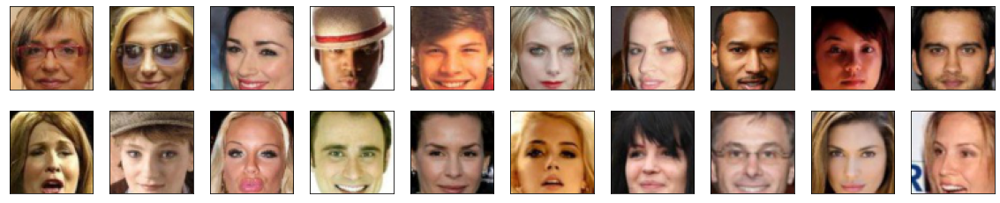

In [7]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def denormalize(images):
    """Transform images from [-1.0, 1.0] to [0, 255] and cast them to uint8."""
    return ((images + 1.) / 2. * 255).astype(np.uint8)

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
    img = dataset[idx].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = denormalize(img)
    ax.imshow(img)

## Model implementation

As you know, a GAN is comprised of two adversarial networks, a discriminator and a generator. Now that we have a working data pipeline, we need to implement the discriminator and the generator. 

Feel free to implement any additional class or function.

### Exercise: Create the discriminator

The discriminator's job is to score real and fake images. You have two constraints here:
* the discriminator takes as input a **batch of 64x64x3 images**
* the output should be a single value (=score)

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips
* To scale down from the input image, you can either use `Conv2d` layers with the correct hyperparameters or Pooling layers.
* If you plan on using gradient penalty, do not use Batch Normalization layers in the discriminator.

In [8]:
import torch.nn as nn
from torch.nn import Module
import torch.nn.functional as F

In [10]:
class Discriminator(Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.conv1 = nn.Conv2d(in_channels=3,
                               out_channels=128,
                               kernel_size=5,
                               stride=2,
                               padding=2) # Size 32x32
        
        self.conv2 = nn.Conv2d(in_channels=128,
                               out_channels=256,
                               kernel_size=5,
                               stride=2,
                               padding=2) # Size 16x16
        self.batchnorm2 = nn.BatchNorm2d(256)

        self.conv3 = nn.Conv2d(in_channels=256,
                               out_channels=512,
                               kernel_size=5,
                               stride=2,
                               padding=2) # Size is 8x8
        self.batchnorm3 = nn.BatchNorm2d(512)

        self.conv4 = nn.Conv2d(in_channels=512,
                               out_channels=1024,
                               kernel_size=5,
                               stride=2,
                               padding=2) # Size is 4x4
        self.batchnorm4 = nn.BatchNorm2d(1024)          

        self.fc1 = nn.Linear(in_features=4*4*1024,
                             out_features=1)      
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        x = F.leaky_relu(self.conv1(x), 0.2)
        x = F.leaky_relu(self.batchnorm2(self.conv2(x)), 0.2)
        x = F.leaky_relu(self.batchnorm3(self.conv3(x)), 0.2)
        x = F.leaky_relu(self.batchnorm4(self.conv4(x)), 0.2)        

        x = torch.flatten(x, 1)

        x = self.fc1(x) 
        x = torch.unsqueeze(x, 2) # 2d to 4D conversion
        x = torch.unsqueeze(x, 3) # 2d to 4D conversion
        return x

In [60]:
# class Discriminator(nn.Module):
#     def __init__(self, conv_dim: int = 64):
#         super(Discriminator, self).__init__()
#         self.main = nn.Sequential(
#             # input is ``(nc) x 64 x 64``
#             nn.Conv2d(3, conv_dim, 4, 2, 1, bias=False),
#             nn.LeakyReLU(0.2, inplace=True),
#             # state size. ``(ndf) x 32 x 32``
#             nn.Conv2d(conv_dim, conv_dim * 2, 4, 2, 1, bias=False),
#             nn.BatchNorm2d(conv_dim * 2),
#             nn.LeakyReLU(0.2, inplace=True),
#             # state size. ``(ndf*2) x 16 x 16``
#             nn.Conv2d(conv_dim * 2, conv_dim * 4, 4, 2, 1, bias=False),
#             nn.BatchNorm2d(conv_dim * 4),
#             nn.LeakyReLU(0.2, inplace=True),
#             # state size. ``(ndf*4) x 8 x 8``
#             nn.Conv2d(conv_dim * 4, conv_dim * 8, 4, 2, 1, bias=False),
#             nn.BatchNorm2d(conv_dim * 8),
#             nn.LeakyReLU(0.2, inplace=True),
#             # state size. ``(ndf*8) x 4 x 4``
#             nn.Conv2d(conv_dim * 8, 1, 4, 1, 0, bias=False),
#             nn.Sigmoid()
#         )

#     def forward(self, input):
#         return self.main(input)

In [11]:
discriminator = Discriminator()
print(discriminator)
images = torch.randn(1, 3, 64, 64)
score = discriminator(images)
print("Shape out = ",  score.shape)

Discriminator(
  (conv1): Conv2d(3, 128, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
  (conv2): Conv2d(128, 256, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
  (batchnorm2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv2d(256, 512, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
  (batchnorm3): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv4): Conv2d(512, 1024, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
  (batchnorm4): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (fc1): Linear(in_features=16384, out_features=1, bias=True)
)
Shape out =  torch.Size([1, 1, 1, 1])


In [12]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to check your discriminator implementation
discriminator = Discriminator()
tests.check_discriminator(discriminator)

Congrats, your discriminator implementation passed all the tests


### Exercise: create the generator

The generator's job creates the "fake images" and learns the dataset distribution. You have three constraints here:
* the generator takes as input a vector of dimension `[batch_size, latent_dimension, 1, 1]`
* the generator must outputs **64x64x3 images**

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips:
* to scale up from the latent vector input, you can use `ConvTranspose2d` layers
* as often with Gan, **Batch Normalization** helps with training

In [15]:
class Generator(Module):
    def __init__(self, latent_dim: int):
        super(Generator, self).__init__()
        # TODO: instantiate the different layers

        self.first_conv_in_channels = 1024 
        first_conv_out_channels = 512 
        second_conv_out_channels = 256 
        third_conv_out_channels = 128 # rgb
        fourth_conv_out_channels = 3 # rgb

        self.fc1 = nn.Linear(in_features=latent_dim,
                             out_features=4*4*1024)
        
        self.transpose_conv1 = nn.ConvTranspose2d(
                                    in_channels=1024,
                                    out_channels=512,
                                    kernel_size=2,
                                    padding=0,
                                    stride=2)
        self.batch_norm1 = nn.BatchNorm2d(512)

        self.transpose_conv2 = nn.ConvTranspose2d(
                                    in_channels=512,
                                    out_channels=256,
                                    kernel_size=2,
                                    padding=0,
                                    stride=2)
        self.batch_norm2 = nn.BatchNorm2d(256)

        self.transpose_conv3 = nn.ConvTranspose2d(
                                    in_channels=256,
                                    out_channels=128,
                                    kernel_size=2,
                                    padding=0,
                                    stride=2)
        self.batch_norm3 = nn.BatchNorm2d(128)  

        self.transpose_conv4 = nn.ConvTranspose2d(
                                    in_channels=128,
                                    out_channels=3,
                                    kernel_size=2,
                                    padding=0,
                                    stride=2)                

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        x = torch.flatten(x, 1)
        x = self.fc1(x)

        batch_size = len(x)
        x = x.view(batch_size, 1024, 4, 4) # order based on https://pytorch.org/docs/stable/generated/torch.nn.ConvTranspose2d.html?highlight=convtranspose2d#torch.nn.ConvTranspose2d

        x = F.relu(self.batch_norm1(self.transpose_conv1(x)))
        x = F.relu(self.batch_norm2(self.transpose_conv2(x)))
        x = F.relu(self.batch_norm3(self.transpose_conv3(x)))
        x = F.tanh(self.transpose_conv4(x))
        
        return x

In [64]:
# class Generator(nn.Module):
#     def __init__(self, latent_dim: int, conv_dim: int = 64):
#         super(Generator, self).__init__()
#         self.main = nn.Sequential(
#             # input is Z, going into a convolution
#             nn.ConvTranspose2d( latent_dim, conv_dim * 8, 4, 1, 0, bias=False),
#             nn.BatchNorm2d(conv_dim * 8),
#             nn.ReLU(True),
#             # state size. ``(ngf*8) x 4 x 4``
#             nn.ConvTranspose2d(conv_dim * 8, conv_dim * 4, 4, 2, 1, bias=False),
#             nn.BatchNorm2d(conv_dim * 4),
#             nn.ReLU(True),
#             # state size. ``(ngf*4) x 8 x 8``
#             nn.ConvTranspose2d( conv_dim * 4, conv_dim * 2, 4, 2, 1, bias=False),
#             nn.BatchNorm2d(conv_dim * 2),
#             nn.ReLU(True),
#             # state size. ``(ngf*2) x 16 x 16``
#             nn.ConvTranspose2d( conv_dim * 2, conv_dim, 4, 2, 1, bias=False),
#             nn.BatchNorm2d(conv_dim),
#             nn.ReLU(True),
#             # state size. ``(ngf) x 32 x 32``
#             nn.ConvTranspose2d( conv_dim, 3, 4, 2, 1, bias=False),
#             nn.Tanh()
#             # state size. ``(nc) x 64 x 64``
#         )

#     def forward(self, input):
#         return self.main(input)

In [16]:
latent_dim = 128
lv = torch.randn(1, latent_dim, 1, 1)
generator = Generator(latent_dim)
print(generator)
image = generator(lv)
print("Shape out = ",  image.shape)

Generator(
  (fc1): Linear(in_features=128, out_features=16384, bias=True)
  (transpose_conv1): ConvTranspose2d(1024, 512, kernel_size=(2, 2), stride=(2, 2))
  (batch_norm1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (transpose_conv2): ConvTranspose2d(512, 256, kernel_size=(2, 2), stride=(2, 2))
  (batch_norm2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (transpose_conv3): ConvTranspose2d(256, 128, kernel_size=(2, 2), stride=(2, 2))
  (batch_norm3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (transpose_conv4): ConvTranspose2d(128, 3, kernel_size=(2, 2), stride=(2, 2))
)
Shape out =  torch.Size([1, 3, 64, 64])


In [17]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your generator implementation
latent_dim = 128
generator = Generator(latent_dim)
tests.check_generator(generator, latent_dim)

Congrats, your generator implementation passed all the tests


## Optimizer

In the following section, we create the optimizers for the generator and discriminator. You may want to experiment with different optimizers, learning rates and other hyperparameters as they tend to impact the output quality.

### Exercise: implement the optimizers

In [18]:
import torch.optim as optim

def create_optimizers(generator: Module, discriminator: Module):
    """ This function should return the optimizers of the generator and the discriminator """
    # TODO: implement the generator and discriminator optimizers
    g_optimizer = optim.Adam(generator.parameters(),lr = 0.0002,betas = (0.5,0.999))
    d_optimizer = optim.Adam(discriminator.parameters(),lr = 0.0002,betas = (0.5,0.999))
    
    return g_optimizer, d_optimizer

## Losses implementation

In this section, we are going to implement the loss function for the generator and the discriminator. You can and should experiment with different loss function.

Some tips:
* You can choose the commonly used the binary cross entropy loss or select other losses we have discovered in the course, such as the Wasserstein distance.
* You may want to implement a gradient penalty function as discussed in the course. It is not required and the code will work whether you implement it or not.

### Exercise: implement the generator loss

The generator's goal is to get the discriminator to think its generated images (= "fake" images) are real.

In [19]:
def generator_loss(fake_logits):
    """ Generator loss, takes the fake scores as inputs. """
    # TODO: implement the generator loss 
    # Label Smoothing
    labels = torch.ones(fake_logits.size())*0.9
    labels = labels.cuda()
    
    criterion = torch.nn.BCEWithLogitsLoss()
    loss = criterion(fake_logits.squeeze(), labels.squeeze())   
    
    return loss

### Exercise: implement the discriminator loss

We want the discriminator to give high scores to real images and low scores to fake ones and the discriminator loss should reflect that.

In [20]:
def discriminator_loss(real_logits, fake_logits):
    """ Discriminator loss, takes the fake and real logits as inputs. """
    # TODO: implement the discriminator loss 

    criterion = torch.nn.BCEWithLogitsLoss()

    # real_loss
    labels = torch.ones(real_logits.size())*0.9
    labels = labels.cuda()
    real_loss = criterion(real_logits.squeeze(), labels.squeeze())

    # fake_loss
    labels = torch.zeros(fake_logits.size())
    labels = labels.cuda()
    fake_loss = criterion(fake_logits.squeeze(), labels.squeeze())

    loss = real_loss + fake_loss

    return loss

### Exercise (Optional): Implement the gradient Penalty

In the course, we discussed the importance of gradient penalty in training certain types of Gans. Implementing this function is not required and depends on some of the design decision you made (discriminator architecture, loss functions).

In [21]:
def gradient_penalty(discriminator, real_samples, fake_samples):
    """ This function enforces """
    gp = 0
    # TODO (Optional): implement the gradient penalty
    return gp

## Training


Training will involve alternating between training the discriminator and the generator. You'll use your functions real_loss and fake_loss to help you calculate the discriminator losses.

* You should train the discriminator by alternating on real and fake images
* Then the generator, which tries to trick the discriminator and should have an opposing loss function

### Exercise: implement the generator step and the discriminator step functions

Each function should do the following:
* calculate the loss
* backpropagate the gradient
* perform one optimizer step

In [22]:
def generator_step(batch_size: int, latent_dim: int, 
                   generator: Module, 
                   discriminator: Module, 
                   g_optimizer: optim.Adam) -> Dict:
    """ One training step of the generator. """
    # TODO: implement the generator step (foward pass, loss calculation and backward pass)

    # Generate fake images
    fakes = np.random.uniform(-1, 1, size=(batch_size, latent_dim))
    fakes = torch.from_numpy(fakes).float()
    fakes = fakes.cuda()
    fake_images = generator(fakes)

    fake_images = fake_images.cuda() 
    g_optimizer.zero_grad()         
    
    # perform backprop
    g_loss = generator_loss(discriminator(fake_images))
    g_loss.backward()
    g_optimizer.step()
        
    return {'loss': g_loss}


def discriminator_step(batch_size: int, latent_dim: int, real_images: torch.Tensor,
                       generator: Module, 
                       discriminator: Module, 
                       d_optimizer: optim.Adam) -> Dict:
    """ One training step of the discriminator. """

    real_images = real_images.cuda()
    d_optimizer.zero_grad()
    
    # Generate fake images
    fakes = np.random.uniform(-1, 1, size=(batch_size, latent_dim))
    fakes = torch.from_numpy(fakes).float()
    fakes = fakes.cuda()
    fake_images = generator(fakes)

    fake_images = fake_images.cuda()       

    d_loss = discriminator_loss(real_logits=discriminator(real_images), 
                       fake_logits=discriminator(fake_images))       

    d_loss.backward()
    d_optimizer.step()

    gp = 0 # did not implement gradient penalty

    return {'loss': d_loss, 'gp': gp}

### Main training loop

You don't have to implement anything here but you can experiment with different hyperparameters.

In [23]:
from datetime import datetime

In [24]:
# you can experiment with different dimensions of latent spaces
latent_dim = 128

# update to cpu if you do not have access to a gpu
device = 'cuda'

# number of epochs to train your model
n_epochs = 50

# number of images in each batch
batch_size = 64

In [25]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
print_every = 50

# Create optimizers for the discriminator D and generator G
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)
g_optimizer, d_optimizer = create_optimizers(generator, discriminator)

dataloader = DataLoader(dataset, 
                        batch_size=64, 
                        shuffle=True, 
                        num_workers=4, 
                        drop_last=True,
                        pin_memory=False)

In [26]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def display(fixed_latent_vector: torch.Tensor):
    """ helper function to display images during training """
    fig = plt.figure(figsize=(14, 4))
    plot_size = 16
    for idx in np.arange(plot_size):
        ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
        img = fixed_latent_vector[idx, ...].detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = denormalize(img)
        ax.imshow(img)
    plt.show()

### Exercise: implement the training strategy

You should experiment with different training strategies. For example:

* train the generator more often than the discriminator. 
* added noise to the input image
* use label smoothing

Implement with your training strategy below.

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1933: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")


2024-10-29 20:00:52 | Epoch [1/50] | Batch 0/509 | d_loss: 1.6129 | g_loss: 0.6039
2024-10-29 20:01:23 | Epoch [1/50] | Batch 50/509 | d_loss: 0.3361 | g_loss: 5.7655
2024-10-29 20:01:55 | Epoch [1/50] | Batch 100/509 | d_loss: 0.3476 | g_loss: 5.9880
2024-10-29 20:02:26 | Epoch [1/50] | Batch 150/509 | d_loss: 0.3316 | g_loss: 5.8372
2024-10-29 20:02:57 | Epoch [1/50] | Batch 200/509 | d_loss: 0.7342 | g_loss: 2.9048
2024-10-29 20:03:27 | Epoch [1/50] | Batch 250/509 | d_loss: 0.4376 | g_loss: 2.8454
2024-10-29 20:03:58 | Epoch [1/50] | Batch 300/509 | d_loss: 0.6501 | g_loss: 4.4252
2024-10-29 20:04:29 | Epoch [1/50] | Batch 350/509 | d_loss: 0.6319 | g_loss: 1.9966
2024-10-29 20:05:00 | Epoch [1/50] | Batch 400/509 | d_loss: 0.6111 | g_loss: 2.3079
2024-10-29 20:05:31 | Epoch [1/50] | Batch 450/509 | d_loss: 1.3344 | g_loss: 1.1291
2024-10-29 20:06:02 | Epoch [1/50] | Batch 500/509 | d_loss: 0.4855 | g_loss: 3.1969


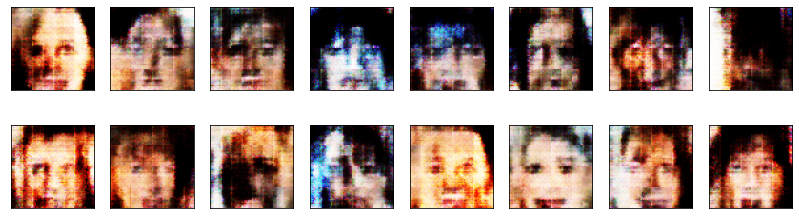

2024-10-29 20:06:14 | Epoch [2/50] | Batch 0/509 | d_loss: 0.5422 | g_loss: 3.8021
2024-10-29 20:06:45 | Epoch [2/50] | Batch 50/509 | d_loss: 0.4431 | g_loss: 2.9398
2024-10-29 20:07:16 | Epoch [2/50] | Batch 100/509 | d_loss: 0.6217 | g_loss: 2.9684
2024-10-29 20:07:47 | Epoch [2/50] | Batch 150/509 | d_loss: 0.5847 | g_loss: 2.1809
2024-10-29 20:08:18 | Epoch [2/50] | Batch 200/509 | d_loss: 0.5289 | g_loss: 2.4161
2024-10-29 20:08:49 | Epoch [2/50] | Batch 250/509 | d_loss: 0.7159 | g_loss: 3.9079
2024-10-29 20:09:20 | Epoch [2/50] | Batch 300/509 | d_loss: 0.3863 | g_loss: 3.3883
2024-10-29 20:09:50 | Epoch [2/50] | Batch 350/509 | d_loss: 0.4109 | g_loss: 2.8611
2024-10-29 20:10:21 | Epoch [2/50] | Batch 400/509 | d_loss: 0.3911 | g_loss: 5.2224
2024-10-29 20:10:53 | Epoch [2/50] | Batch 450/509 | d_loss: 0.8078 | g_loss: 1.6470
2024-10-29 20:11:24 | Epoch [2/50] | Batch 500/509 | d_loss: 0.4108 | g_loss: 3.8154


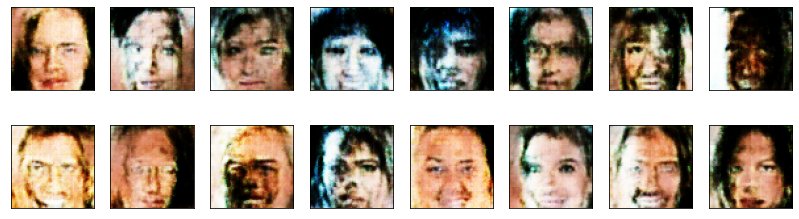

2024-10-29 20:11:32 | Epoch [3/50] | Batch 0/509 | d_loss: 0.6141 | g_loss: 1.9178
2024-10-29 20:12:03 | Epoch [3/50] | Batch 50/509 | d_loss: 0.8624 | g_loss: 1.7054
2024-10-29 20:12:34 | Epoch [3/50] | Batch 100/509 | d_loss: 0.5534 | g_loss: 2.6280
2024-10-29 20:13:05 | Epoch [3/50] | Batch 150/509 | d_loss: 0.4048 | g_loss: 4.2481
2024-10-29 20:13:36 | Epoch [3/50] | Batch 200/509 | d_loss: 0.4060 | g_loss: 4.3035
2024-10-29 20:14:07 | Epoch [3/50] | Batch 250/509 | d_loss: 1.2113 | g_loss: 6.8469
2024-10-29 20:14:38 | Epoch [3/50] | Batch 300/509 | d_loss: 0.4554 | g_loss: 5.3074
2024-10-29 20:15:09 | Epoch [3/50] | Batch 350/509 | d_loss: 0.4271 | g_loss: 5.4394
2024-10-29 20:15:40 | Epoch [3/50] | Batch 400/509 | d_loss: 0.5452 | g_loss: 3.0776
2024-10-29 20:16:12 | Epoch [3/50] | Batch 450/509 | d_loss: 0.5512 | g_loss: 4.3244
2024-10-29 20:16:42 | Epoch [3/50] | Batch 500/509 | d_loss: 0.4001 | g_loss: 4.4657


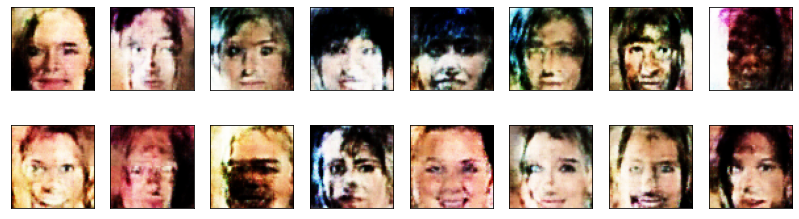

2024-10-29 20:16:53 | Epoch [4/50] | Batch 0/509 | d_loss: 0.3989 | g_loss: 3.5792
2024-10-29 20:17:24 | Epoch [4/50] | Batch 50/509 | d_loss: 0.5990 | g_loss: 2.1523
2024-10-29 20:17:55 | Epoch [4/50] | Batch 100/509 | d_loss: 0.4772 | g_loss: 2.6252
2024-10-29 20:18:26 | Epoch [4/50] | Batch 150/509 | d_loss: 0.4258 | g_loss: 3.2171
2024-10-29 20:18:57 | Epoch [4/50] | Batch 200/509 | d_loss: 0.4165 | g_loss: 5.8479
2024-10-29 20:19:28 | Epoch [4/50] | Batch 250/509 | d_loss: 0.6466 | g_loss: 3.2333
2024-10-29 20:19:59 | Epoch [4/50] | Batch 300/509 | d_loss: 0.7905 | g_loss: 1.3726
2024-10-29 20:20:30 | Epoch [4/50] | Batch 350/509 | d_loss: 0.5150 | g_loss: 3.3257
2024-10-29 20:21:01 | Epoch [4/50] | Batch 400/509 | d_loss: 0.6084 | g_loss: 2.7262
2024-10-29 20:21:32 | Epoch [4/50] | Batch 450/509 | d_loss: 0.4287 | g_loss: 4.1795
2024-10-29 20:22:03 | Epoch [4/50] | Batch 500/509 | d_loss: 0.3811 | g_loss: 4.3354


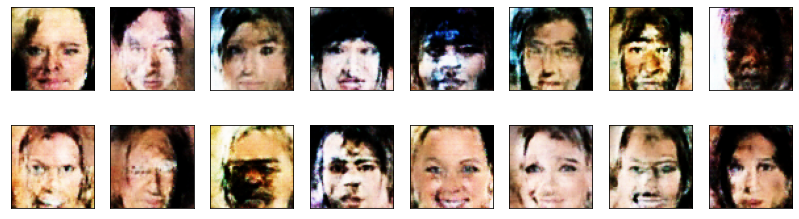

2024-10-29 20:22:12 | Epoch [5/50] | Batch 0/509 | d_loss: 0.4133 | g_loss: 5.5857
2024-10-29 20:22:43 | Epoch [5/50] | Batch 50/509 | d_loss: 0.5103 | g_loss: 3.5269
2024-10-29 20:23:14 | Epoch [5/50] | Batch 100/509 | d_loss: 0.3903 | g_loss: 3.9021
2024-10-29 20:23:45 | Epoch [5/50] | Batch 150/509 | d_loss: 0.4589 | g_loss: 3.6180
2024-10-29 20:24:16 | Epoch [5/50] | Batch 200/509 | d_loss: 0.4116 | g_loss: 2.5913
2024-10-29 20:24:47 | Epoch [5/50] | Batch 250/509 | d_loss: 0.3556 | g_loss: 4.5345
2024-10-29 20:25:18 | Epoch [5/50] | Batch 300/509 | d_loss: 0.5470 | g_loss: 5.2318
2024-10-29 20:25:49 | Epoch [5/50] | Batch 350/509 | d_loss: 0.4538 | g_loss: 3.0816
2024-10-29 20:26:20 | Epoch [5/50] | Batch 400/509 | d_loss: 0.3789 | g_loss: 4.6055
2024-10-29 20:26:51 | Epoch [5/50] | Batch 450/509 | d_loss: 0.3588 | g_loss: 3.8544
2024-10-29 20:27:22 | Epoch [5/50] | Batch 500/509 | d_loss: 0.3490 | g_loss: 4.6532


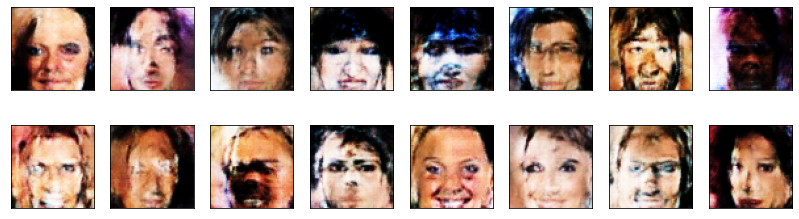

2024-10-29 20:27:32 | Epoch [6/50] | Batch 0/509 | d_loss: 0.3509 | g_loss: 4.5780
2024-10-29 20:28:03 | Epoch [6/50] | Batch 50/509 | d_loss: 0.4359 | g_loss: 3.4799
2024-10-29 20:28:34 | Epoch [6/50] | Batch 100/509 | d_loss: 0.4396 | g_loss: 4.2436
2024-10-29 20:29:04 | Epoch [6/50] | Batch 150/509 | d_loss: 0.5465 | g_loss: 3.2246
2024-10-29 20:29:35 | Epoch [6/50] | Batch 200/509 | d_loss: 0.4288 | g_loss: 3.1491
2024-10-29 20:30:07 | Epoch [6/50] | Batch 250/509 | d_loss: 0.3902 | g_loss: 4.3007
2024-10-29 20:30:38 | Epoch [6/50] | Batch 300/509 | d_loss: 0.3657 | g_loss: 4.5880
2024-10-29 20:31:09 | Epoch [6/50] | Batch 350/509 | d_loss: 0.3713 | g_loss: 6.0601
2024-10-29 20:31:40 | Epoch [6/50] | Batch 400/509 | d_loss: 0.5165 | g_loss: 2.7212
2024-10-29 20:32:11 | Epoch [6/50] | Batch 450/509 | d_loss: 0.4140 | g_loss: 4.1558
2024-10-29 20:32:42 | Epoch [6/50] | Batch 500/509 | d_loss: 0.4654 | g_loss: 3.6406


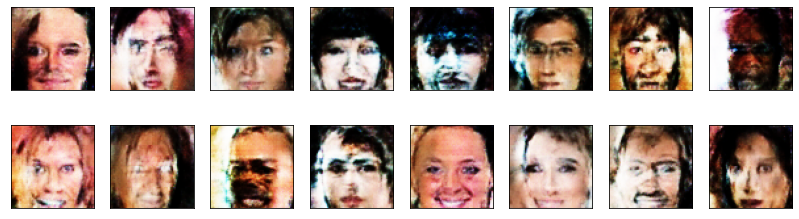

2024-10-29 20:32:52 | Epoch [7/50] | Batch 0/509 | d_loss: 0.3770 | g_loss: 4.5417
2024-10-29 20:33:23 | Epoch [7/50] | Batch 50/509 | d_loss: 0.4494 | g_loss: 4.1692
2024-10-29 20:33:54 | Epoch [7/50] | Batch 100/509 | d_loss: 0.3795 | g_loss: 3.9166
2024-10-29 20:34:25 | Epoch [7/50] | Batch 150/509 | d_loss: 0.3561 | g_loss: 4.5066
2024-10-29 20:34:56 | Epoch [7/50] | Batch 200/509 | d_loss: 1.8994 | g_loss: 10.2815
2024-10-29 20:35:26 | Epoch [7/50] | Batch 250/509 | d_loss: 0.4410 | g_loss: 2.8602
2024-10-29 20:35:57 | Epoch [7/50] | Batch 300/509 | d_loss: 0.6080 | g_loss: 4.2234
2024-10-29 20:36:28 | Epoch [7/50] | Batch 350/509 | d_loss: 0.8246 | g_loss: 1.8289
2024-10-29 20:36:59 | Epoch [7/50] | Batch 400/509 | d_loss: 0.4126 | g_loss: 4.8179
2024-10-29 20:37:30 | Epoch [7/50] | Batch 450/509 | d_loss: 0.4490 | g_loss: 3.1987
2024-10-29 20:38:01 | Epoch [7/50] | Batch 500/509 | d_loss: 0.5873 | g_loss: 4.0286


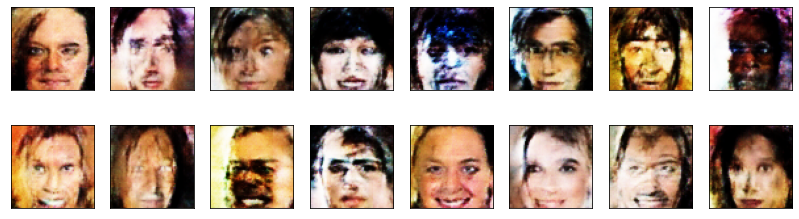

2024-10-29 20:38:11 | Epoch [8/50] | Batch 0/509 | d_loss: 0.4739 | g_loss: 2.9257
2024-10-29 20:38:42 | Epoch [8/50] | Batch 50/509 | d_loss: 0.3743 | g_loss: 4.1738
2024-10-29 20:39:13 | Epoch [8/50] | Batch 100/509 | d_loss: 0.4268 | g_loss: 2.5057
2024-10-29 20:39:43 | Epoch [8/50] | Batch 150/509 | d_loss: 0.3490 | g_loss: 5.3990
2024-10-29 20:40:14 | Epoch [8/50] | Batch 200/509 | d_loss: 0.3911 | g_loss: 4.0444
2024-10-29 20:40:45 | Epoch [8/50] | Batch 250/509 | d_loss: 0.3877 | g_loss: 4.0204
2024-10-29 20:41:16 | Epoch [8/50] | Batch 300/509 | d_loss: 0.4207 | g_loss: 3.0948
2024-10-29 20:41:47 | Epoch [8/50] | Batch 350/509 | d_loss: 0.3662 | g_loss: 4.7214
2024-10-29 20:42:18 | Epoch [8/50] | Batch 400/509 | d_loss: 0.3575 | g_loss: 6.2260
2024-10-29 20:42:49 | Epoch [8/50] | Batch 450/509 | d_loss: 0.3443 | g_loss: 4.5733
2024-10-29 20:43:20 | Epoch [8/50] | Batch 500/509 | d_loss: 0.4689 | g_loss: 2.4800


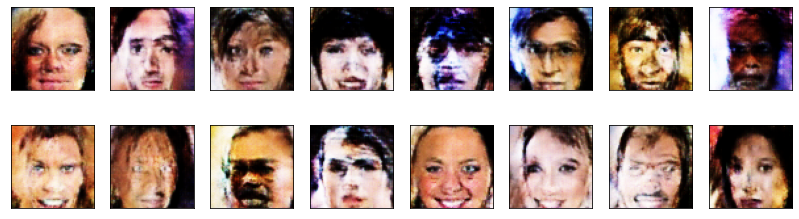

2024-10-29 20:43:30 | Epoch [9/50] | Batch 0/509 | d_loss: 0.5634 | g_loss: 3.3934
2024-10-29 20:44:01 | Epoch [9/50] | Batch 50/509 | d_loss: 0.5169 | g_loss: 2.6562
2024-10-29 20:44:32 | Epoch [9/50] | Batch 100/509 | d_loss: 0.4210 | g_loss: 5.2861
2024-10-29 20:45:03 | Epoch [9/50] | Batch 150/509 | d_loss: 0.3660 | g_loss: 4.2919
2024-10-29 20:45:34 | Epoch [9/50] | Batch 200/509 | d_loss: 0.7901 | g_loss: 1.4393
2024-10-29 20:46:05 | Epoch [9/50] | Batch 250/509 | d_loss: 0.3561 | g_loss: 4.9939
2024-10-29 20:46:36 | Epoch [9/50] | Batch 300/509 | d_loss: 0.3395 | g_loss: 5.7614
2024-10-29 20:47:07 | Epoch [9/50] | Batch 350/509 | d_loss: 0.3644 | g_loss: 3.7832
2024-10-29 20:47:38 | Epoch [9/50] | Batch 400/509 | d_loss: 0.4142 | g_loss: 4.1000
2024-10-29 20:48:09 | Epoch [9/50] | Batch 450/509 | d_loss: 0.4081 | g_loss: 4.1628
2024-10-29 20:48:40 | Epoch [9/50] | Batch 500/509 | d_loss: 0.4093 | g_loss: 3.5473


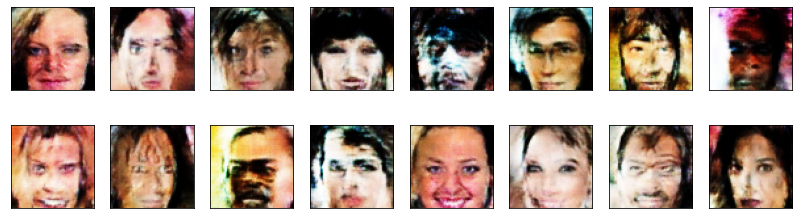

2024-10-29 20:48:49 | Epoch [10/50] | Batch 0/509 | d_loss: 0.4330 | g_loss: 3.7416
2024-10-29 20:49:20 | Epoch [10/50] | Batch 50/509 | d_loss: 0.3581 | g_loss: 4.7078
2024-10-29 20:49:51 | Epoch [10/50] | Batch 100/509 | d_loss: 0.5429 | g_loss: 6.5784
2024-10-29 20:50:22 | Epoch [10/50] | Batch 150/509 | d_loss: 0.4360 | g_loss: 3.6673
2024-10-29 20:50:53 | Epoch [10/50] | Batch 200/509 | d_loss: 0.3479 | g_loss: 4.9030
2024-10-29 20:51:24 | Epoch [10/50] | Batch 250/509 | d_loss: 0.4032 | g_loss: 4.0317
2024-10-29 20:51:55 | Epoch [10/50] | Batch 300/509 | d_loss: 0.4004 | g_loss: 4.9744
2024-10-29 20:52:26 | Epoch [10/50] | Batch 350/509 | d_loss: 0.3635 | g_loss: 4.9124
2024-10-29 20:52:57 | Epoch [10/50] | Batch 400/509 | d_loss: 0.3655 | g_loss: 5.4193
2024-10-29 20:53:28 | Epoch [10/50] | Batch 450/509 | d_loss: 0.3911 | g_loss: 5.3218
2024-10-29 20:53:59 | Epoch [10/50] | Batch 500/509 | d_loss: 0.4894 | g_loss: 5.4691


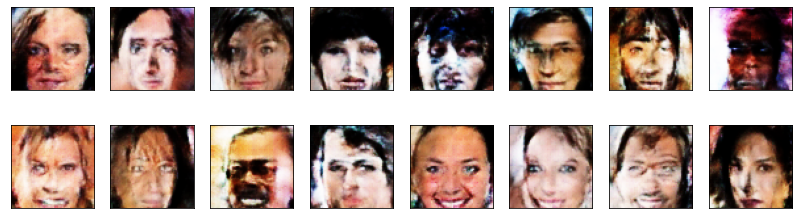

2024-10-29 20:54:08 | Epoch [11/50] | Batch 0/509 | d_loss: 0.4422 | g_loss: 8.4733
2024-10-29 20:54:39 | Epoch [11/50] | Batch 50/509 | d_loss: 0.4091 | g_loss: 7.2358
2024-10-29 20:55:10 | Epoch [11/50] | Batch 100/509 | d_loss: 0.3967 | g_loss: 4.9826
2024-10-29 20:55:41 | Epoch [11/50] | Batch 150/509 | d_loss: 0.3575 | g_loss: 5.0328
2024-10-29 20:56:12 | Epoch [11/50] | Batch 200/509 | d_loss: 0.3440 | g_loss: 6.9068
2024-10-29 20:56:43 | Epoch [11/50] | Batch 250/509 | d_loss: 0.3492 | g_loss: 4.9869
2024-10-29 20:57:14 | Epoch [11/50] | Batch 300/509 | d_loss: 0.6088 | g_loss: 5.2862
2024-10-29 20:57:45 | Epoch [11/50] | Batch 350/509 | d_loss: 0.3981 | g_loss: 4.4677
2024-10-29 20:58:16 | Epoch [11/50] | Batch 400/509 | d_loss: 0.3546 | g_loss: 5.2601
2024-10-29 20:58:47 | Epoch [11/50] | Batch 450/509 | d_loss: 0.4517 | g_loss: 5.3529
2024-10-29 20:59:18 | Epoch [11/50] | Batch 500/509 | d_loss: 0.3439 | g_loss: 5.8841


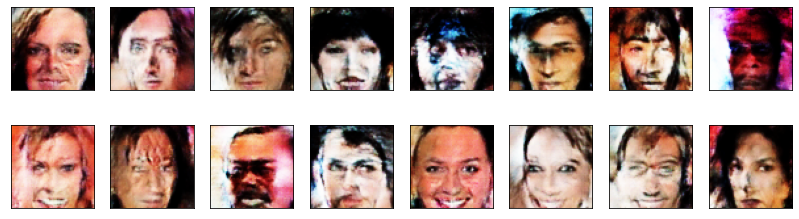

2024-10-29 20:59:28 | Epoch [12/50] | Batch 0/509 | d_loss: 0.3594 | g_loss: 6.3078
2024-10-29 20:59:59 | Epoch [12/50] | Batch 50/509 | d_loss: 0.3484 | g_loss: 5.5054
2024-10-29 21:00:30 | Epoch [12/50] | Batch 100/509 | d_loss: 0.6446 | g_loss: 7.1386
2024-10-29 21:01:01 | Epoch [12/50] | Batch 150/509 | d_loss: 0.3589 | g_loss: 3.9317
2024-10-29 21:01:32 | Epoch [12/50] | Batch 200/509 | d_loss: 0.3529 | g_loss: 4.9167
2024-10-29 21:02:03 | Epoch [12/50] | Batch 250/509 | d_loss: 0.5176 | g_loss: 2.7235
2024-10-29 21:02:34 | Epoch [12/50] | Batch 300/509 | d_loss: 0.4195 | g_loss: 4.0543
2024-10-29 21:03:05 | Epoch [12/50] | Batch 350/509 | d_loss: 0.4147 | g_loss: 4.7698
2024-10-29 21:03:36 | Epoch [12/50] | Batch 400/509 | d_loss: 0.7629 | g_loss: 2.8862
2024-10-29 21:04:07 | Epoch [12/50] | Batch 450/509 | d_loss: 0.4536 | g_loss: 3.4544
2024-10-29 21:04:38 | Epoch [12/50] | Batch 500/509 | d_loss: 0.3842 | g_loss: 5.0975


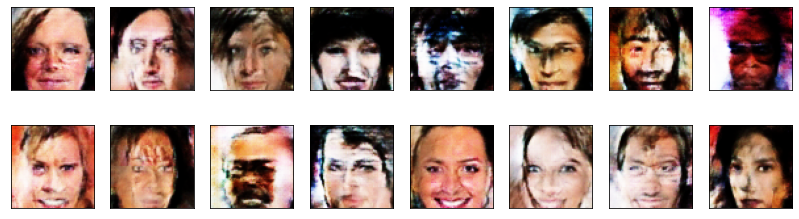

2024-10-29 21:04:48 | Epoch [13/50] | Batch 0/509 | d_loss: 1.1511 | g_loss: 7.0105
2024-10-29 21:05:19 | Epoch [13/50] | Batch 50/509 | d_loss: 0.3535 | g_loss: 4.9487
2024-10-29 21:05:50 | Epoch [13/50] | Batch 100/509 | d_loss: 0.3848 | g_loss: 5.7024
2024-10-29 21:06:21 | Epoch [13/50] | Batch 150/509 | d_loss: 0.3555 | g_loss: 5.2738
2024-10-29 21:06:52 | Epoch [13/50] | Batch 200/509 | d_loss: 0.3395 | g_loss: 6.0879
2024-10-29 21:07:23 | Epoch [13/50] | Batch 250/509 | d_loss: 0.4123 | g_loss: 8.3843
2024-10-29 21:07:54 | Epoch [13/50] | Batch 300/509 | d_loss: 0.3859 | g_loss: 5.3089
2024-10-29 21:08:25 | Epoch [13/50] | Batch 350/509 | d_loss: 0.3724 | g_loss: 5.5747
2024-10-29 21:08:56 | Epoch [13/50] | Batch 400/509 | d_loss: 0.3481 | g_loss: 4.8248
2024-10-29 21:09:27 | Epoch [13/50] | Batch 450/509 | d_loss: 0.3441 | g_loss: 4.1891
2024-10-29 21:09:58 | Epoch [13/50] | Batch 500/509 | d_loss: 0.3765 | g_loss: 5.6813


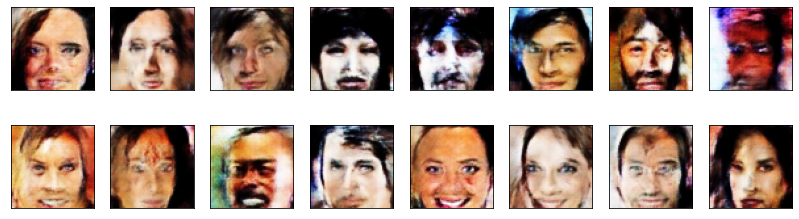

2024-10-29 21:10:07 | Epoch [14/50] | Batch 0/509 | d_loss: 0.3740 | g_loss: 6.3157
2024-10-29 21:10:38 | Epoch [14/50] | Batch 50/509 | d_loss: 0.3372 | g_loss: 5.9682
2024-10-29 21:11:09 | Epoch [14/50] | Batch 100/509 | d_loss: 0.3344 | g_loss: 6.2395
2024-10-29 21:11:40 | Epoch [14/50] | Batch 150/509 | d_loss: 0.4718 | g_loss: 7.4049
2024-10-29 21:12:11 | Epoch [14/50] | Batch 200/509 | d_loss: 0.3465 | g_loss: 5.2461
2024-10-29 21:12:42 | Epoch [14/50] | Batch 250/509 | d_loss: 0.3429 | g_loss: 4.9934
2024-10-29 21:13:13 | Epoch [14/50] | Batch 300/509 | d_loss: 0.4567 | g_loss: 3.1350
2024-10-29 21:13:44 | Epoch [14/50] | Batch 350/509 | d_loss: 0.3736 | g_loss: 4.7870
2024-10-29 21:14:15 | Epoch [14/50] | Batch 400/509 | d_loss: 0.4278 | g_loss: 5.8396
2024-10-29 21:14:46 | Epoch [14/50] | Batch 450/509 | d_loss: 0.3765 | g_loss: 3.9463
2024-10-29 21:15:17 | Epoch [14/50] | Batch 500/509 | d_loss: 0.5646 | g_loss: 3.6504


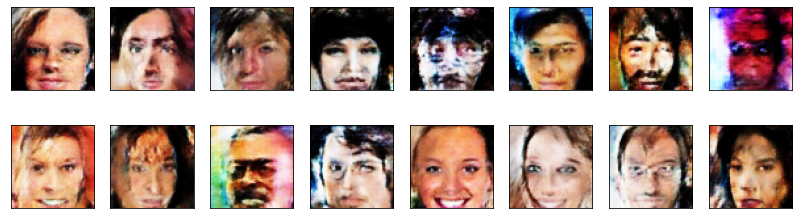

2024-10-29 21:15:26 | Epoch [15/50] | Batch 0/509 | d_loss: 0.4620 | g_loss: 4.3437
2024-10-29 21:15:57 | Epoch [15/50] | Batch 50/509 | d_loss: 0.3920 | g_loss: 4.0182
2024-10-29 21:16:28 | Epoch [15/50] | Batch 100/509 | d_loss: 0.3896 | g_loss: 3.2904
2024-10-29 21:16:59 | Epoch [15/50] | Batch 150/509 | d_loss: 0.3529 | g_loss: 4.8838
2024-10-29 21:17:30 | Epoch [15/50] | Batch 200/509 | d_loss: 0.3886 | g_loss: 6.2642
2024-10-29 21:18:00 | Epoch [15/50] | Batch 250/509 | d_loss: 0.3895 | g_loss: 5.5016
2024-10-29 21:18:31 | Epoch [15/50] | Batch 300/509 | d_loss: 0.3722 | g_loss: 4.6829
2024-10-29 21:19:02 | Epoch [15/50] | Batch 350/509 | d_loss: 0.3825 | g_loss: 5.5321
2024-10-29 21:19:33 | Epoch [15/50] | Batch 400/509 | d_loss: 0.3428 | g_loss: 4.6756
2024-10-29 21:20:04 | Epoch [15/50] | Batch 450/509 | d_loss: 0.3720 | g_loss: 4.8384
2024-10-29 21:20:35 | Epoch [15/50] | Batch 500/509 | d_loss: 1.1619 | g_loss: 5.8153


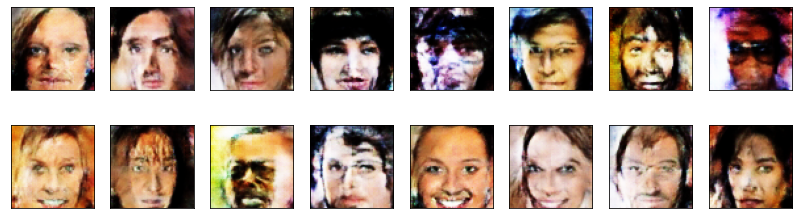

2024-10-29 21:20:47 | Epoch [16/50] | Batch 0/509 | d_loss: 0.4033 | g_loss: 4.1263
2024-10-29 21:21:18 | Epoch [16/50] | Batch 50/509 | d_loss: 0.3958 | g_loss: 4.2531
2024-10-29 21:21:49 | Epoch [16/50] | Batch 100/509 | d_loss: 0.3557 | g_loss: 5.0248
2024-10-29 21:22:20 | Epoch [16/50] | Batch 150/509 | d_loss: 0.3588 | g_loss: 3.9736
2024-10-29 21:22:51 | Epoch [16/50] | Batch 200/509 | d_loss: 0.3555 | g_loss: 4.9242
2024-10-29 21:23:22 | Epoch [16/50] | Batch 250/509 | d_loss: 0.3462 | g_loss: 5.3554
2024-10-29 21:23:52 | Epoch [16/50] | Batch 300/509 | d_loss: 0.3393 | g_loss: 5.3554
2024-10-29 21:24:23 | Epoch [16/50] | Batch 350/509 | d_loss: 0.3740 | g_loss: 4.3661
2024-10-29 21:24:54 | Epoch [16/50] | Batch 400/509 | d_loss: 0.3381 | g_loss: 7.0540
2024-10-29 21:25:25 | Epoch [16/50] | Batch 450/509 | d_loss: 0.3409 | g_loss: 6.7062
2024-10-29 21:25:57 | Epoch [16/50] | Batch 500/509 | d_loss: 0.3895 | g_loss: 3.9996


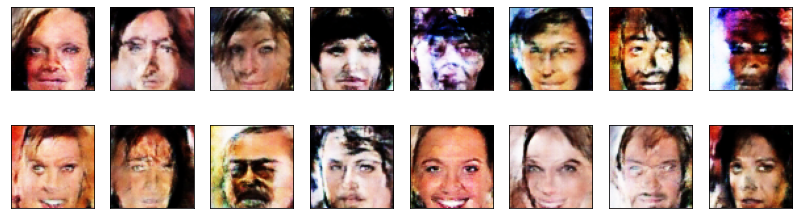

2024-10-29 21:26:06 | Epoch [17/50] | Batch 0/509 | d_loss: 0.3856 | g_loss: 6.0736
2024-10-29 21:26:37 | Epoch [17/50] | Batch 50/509 | d_loss: 0.3694 | g_loss: 5.1091
2024-10-29 21:27:08 | Epoch [17/50] | Batch 100/509 | d_loss: 0.3611 | g_loss: 4.9321
2024-10-29 21:27:38 | Epoch [17/50] | Batch 150/509 | d_loss: 0.3479 | g_loss: 4.6242
2024-10-29 21:28:09 | Epoch [17/50] | Batch 200/509 | d_loss: 0.3581 | g_loss: 5.0336
2024-10-29 21:28:40 | Epoch [17/50] | Batch 250/509 | d_loss: 0.3606 | g_loss: 6.3151
2024-10-29 21:29:11 | Epoch [17/50] | Batch 300/509 | d_loss: 0.3773 | g_loss: 6.4192
2024-10-29 21:29:42 | Epoch [17/50] | Batch 350/509 | d_loss: 0.3816 | g_loss: 4.0920
2024-10-29 21:30:13 | Epoch [17/50] | Batch 400/509 | d_loss: 0.3794 | g_loss: 4.6279
2024-10-29 21:30:44 | Epoch [17/50] | Batch 450/509 | d_loss: 0.5750 | g_loss: 2.4354
2024-10-29 21:31:15 | Epoch [17/50] | Batch 500/509 | d_loss: 0.3697 | g_loss: 3.9644


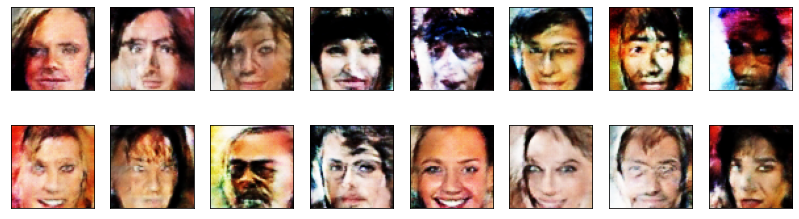

2024-10-29 21:31:25 | Epoch [18/50] | Batch 0/509 | d_loss: 0.9931 | g_loss: 1.4535
2024-10-29 21:31:56 | Epoch [18/50] | Batch 50/509 | d_loss: 0.4037 | g_loss: 3.4344
2024-10-29 21:32:27 | Epoch [18/50] | Batch 100/509 | d_loss: 1.0144 | g_loss: 1.2730
2024-10-29 21:32:58 | Epoch [18/50] | Batch 150/509 | d_loss: 0.8144 | g_loss: 1.8734
2024-10-29 21:33:29 | Epoch [18/50] | Batch 200/509 | d_loss: 0.8458 | g_loss: 1.5687
2024-10-29 21:34:00 | Epoch [18/50] | Batch 250/509 | d_loss: 0.4062 | g_loss: 4.4331
2024-10-29 21:34:31 | Epoch [18/50] | Batch 300/509 | d_loss: 3.0032 | g_loss: 10.9455
2024-10-29 21:35:02 | Epoch [18/50] | Batch 350/509 | d_loss: 0.4080 | g_loss: 3.5305
2024-10-29 21:35:33 | Epoch [18/50] | Batch 400/509 | d_loss: 0.3850 | g_loss: 5.5941
2024-10-29 21:36:04 | Epoch [18/50] | Batch 450/509 | d_loss: 0.4405 | g_loss: 2.8157
2024-10-29 21:36:35 | Epoch [18/50] | Batch 500/509 | d_loss: 0.3515 | g_loss: 4.2953


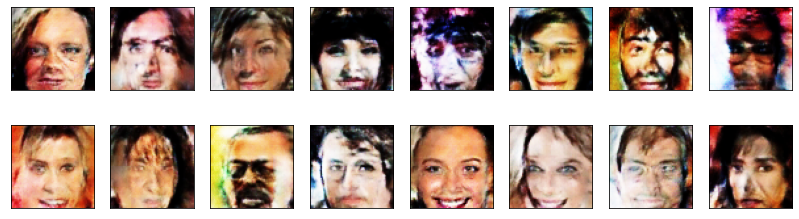

2024-10-29 21:36:44 | Epoch [19/50] | Batch 0/509 | d_loss: 0.3806 | g_loss: 4.1362
2024-10-29 21:37:15 | Epoch [19/50] | Batch 50/509 | d_loss: 0.3863 | g_loss: 4.6673
2024-10-29 21:37:46 | Epoch [19/50] | Batch 100/509 | d_loss: 0.3530 | g_loss: 6.6076
2024-10-29 21:38:16 | Epoch [19/50] | Batch 150/509 | d_loss: 0.3356 | g_loss: 5.6350
2024-10-29 21:38:47 | Epoch [19/50] | Batch 200/509 | d_loss: 0.3533 | g_loss: 5.3567
2024-10-29 21:39:18 | Epoch [19/50] | Batch 250/509 | d_loss: 0.3480 | g_loss: 4.9923
2024-10-29 21:39:50 | Epoch [19/50] | Batch 300/509 | d_loss: 0.3469 | g_loss: 5.0487
2024-10-29 21:40:20 | Epoch [19/50] | Batch 350/509 | d_loss: 0.3416 | g_loss: 4.3232
2024-10-29 21:40:51 | Epoch [19/50] | Batch 400/509 | d_loss: 0.3365 | g_loss: 5.6234
2024-10-29 21:41:22 | Epoch [19/50] | Batch 450/509 | d_loss: 0.6554 | g_loss: 7.2362
2024-10-29 21:41:53 | Epoch [19/50] | Batch 500/509 | d_loss: 0.3935 | g_loss: 3.7741


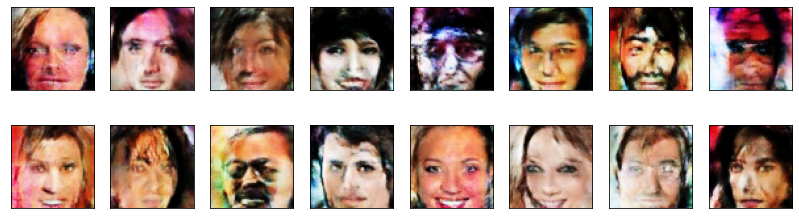

2024-10-29 21:42:04 | Epoch [20/50] | Batch 0/509 | d_loss: 0.3700 | g_loss: 4.7403
2024-10-29 21:42:35 | Epoch [20/50] | Batch 50/509 | d_loss: 0.3743 | g_loss: 4.9982
2024-10-29 21:43:06 | Epoch [20/50] | Batch 100/509 | d_loss: 0.3476 | g_loss: 5.4685
2024-10-29 21:43:37 | Epoch [20/50] | Batch 150/509 | d_loss: 0.3458 | g_loss: 6.1312
2024-10-29 21:44:08 | Epoch [20/50] | Batch 200/509 | d_loss: 0.3444 | g_loss: 3.7038
2024-10-29 21:44:39 | Epoch [20/50] | Batch 250/509 | d_loss: 0.3377 | g_loss: 4.7884
2024-10-29 21:45:10 | Epoch [20/50] | Batch 300/509 | d_loss: 0.3657 | g_loss: 4.1162
2024-10-29 21:45:41 | Epoch [20/50] | Batch 350/509 | d_loss: 0.3800 | g_loss: 4.4624
2024-10-29 21:46:12 | Epoch [20/50] | Batch 400/509 | d_loss: 0.4001 | g_loss: 3.7975
2024-10-29 21:46:43 | Epoch [20/50] | Batch 450/509 | d_loss: 0.4371 | g_loss: 6.0298
2024-10-29 21:47:14 | Epoch [20/50] | Batch 500/509 | d_loss: 0.3627 | g_loss: 5.1989


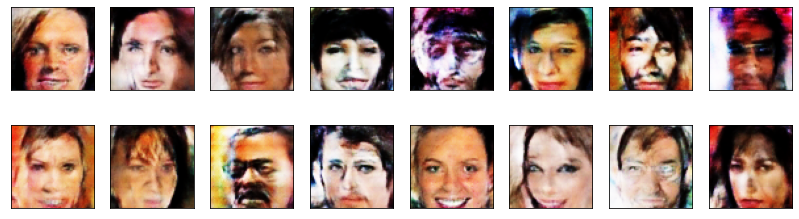

2024-10-29 21:47:23 | Epoch [21/50] | Batch 0/509 | d_loss: 0.3356 | g_loss: 6.2155
2024-10-29 21:47:54 | Epoch [21/50] | Batch 50/509 | d_loss: 0.3521 | g_loss: 7.3890
2024-10-29 21:48:25 | Epoch [21/50] | Batch 100/509 | d_loss: 0.3532 | g_loss: 6.2991
2024-10-29 21:48:56 | Epoch [21/50] | Batch 150/509 | d_loss: 0.3584 | g_loss: 6.3479
2024-10-29 21:49:27 | Epoch [21/50] | Batch 200/509 | d_loss: 0.3532 | g_loss: 5.5049
2024-10-29 21:49:58 | Epoch [21/50] | Batch 250/509 | d_loss: 0.3649 | g_loss: 4.4790
2024-10-29 21:50:29 | Epoch [21/50] | Batch 300/509 | d_loss: 0.5407 | g_loss: 2.5745
2024-10-29 21:51:00 | Epoch [21/50] | Batch 350/509 | d_loss: 0.3768 | g_loss: 4.2068
2024-10-29 21:51:31 | Epoch [21/50] | Batch 400/509 | d_loss: 0.8408 | g_loss: 1.8875
2024-10-29 21:52:02 | Epoch [21/50] | Batch 450/509 | d_loss: 0.3730 | g_loss: 4.6301
2024-10-29 21:52:32 | Epoch [21/50] | Batch 500/509 | d_loss: 0.4223 | g_loss: 5.6791


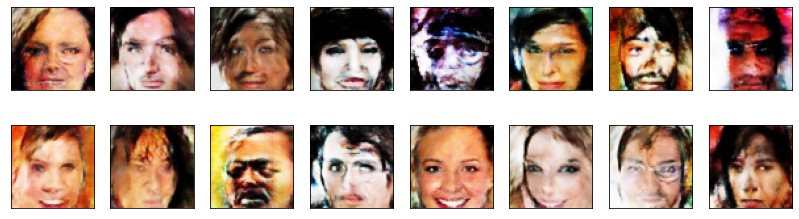

2024-10-29 21:52:42 | Epoch [22/50] | Batch 0/509 | d_loss: 0.3701 | g_loss: 5.0841
2024-10-29 21:53:13 | Epoch [22/50] | Batch 50/509 | d_loss: 0.4431 | g_loss: 4.5338
2024-10-29 21:53:44 | Epoch [22/50] | Batch 100/509 | d_loss: 0.3979 | g_loss: 3.6705
2024-10-29 21:54:15 | Epoch [22/50] | Batch 150/509 | d_loss: 0.3647 | g_loss: 4.0896
2024-10-29 21:54:46 | Epoch [22/50] | Batch 200/509 | d_loss: 0.3937 | g_loss: 3.9497
2024-10-29 21:55:17 | Epoch [22/50] | Batch 250/509 | d_loss: 0.3668 | g_loss: 4.9246
2024-10-29 21:55:48 | Epoch [22/50] | Batch 300/509 | d_loss: 0.3572 | g_loss: 4.5711
2024-10-29 21:56:19 | Epoch [22/50] | Batch 350/509 | d_loss: 0.4948 | g_loss: 7.8188
2024-10-29 21:56:50 | Epoch [22/50] | Batch 400/509 | d_loss: 0.3546 | g_loss: 5.7552
2024-10-29 21:57:21 | Epoch [22/50] | Batch 450/509 | d_loss: 0.3417 | g_loss: 5.7799
2024-10-29 21:57:52 | Epoch [22/50] | Batch 500/509 | d_loss: 0.3469 | g_loss: 6.0993


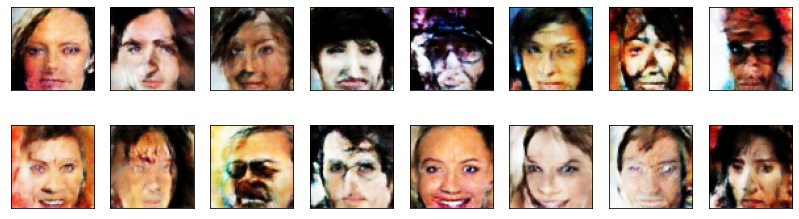

2024-10-29 21:58:02 | Epoch [23/50] | Batch 0/509 | d_loss: 0.3511 | g_loss: 5.6186
2024-10-29 21:58:33 | Epoch [23/50] | Batch 50/509 | d_loss: 0.3503 | g_loss: 5.8172
2024-10-29 21:59:04 | Epoch [23/50] | Batch 100/509 | d_loss: 0.3528 | g_loss: 4.6395
2024-10-29 21:59:35 | Epoch [23/50] | Batch 150/509 | d_loss: 0.3371 | g_loss: 6.2576
2024-10-29 22:00:06 | Epoch [23/50] | Batch 200/509 | d_loss: 0.3591 | g_loss: 6.9032
2024-10-29 22:00:37 | Epoch [23/50] | Batch 250/509 | d_loss: 0.3570 | g_loss: 4.5537
2024-10-29 22:01:08 | Epoch [23/50] | Batch 300/509 | d_loss: 0.3403 | g_loss: 6.2260
2024-10-29 22:01:39 | Epoch [23/50] | Batch 350/509 | d_loss: 0.3613 | g_loss: 5.9946
2024-10-29 22:02:10 | Epoch [23/50] | Batch 400/509 | d_loss: 0.3714 | g_loss: 5.9703
2024-10-29 22:02:41 | Epoch [23/50] | Batch 450/509 | d_loss: 0.3445 | g_loss: 5.6091
2024-10-29 22:03:12 | Epoch [23/50] | Batch 500/509 | d_loss: 0.3330 | g_loss: 5.9149


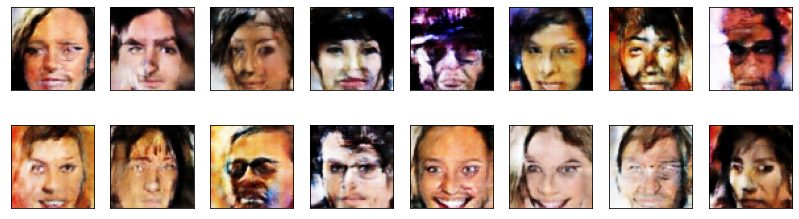

2024-10-29 22:03:21 | Epoch [24/50] | Batch 0/509 | d_loss: 0.3407 | g_loss: 5.3859
2024-10-29 22:03:52 | Epoch [24/50] | Batch 50/509 | d_loss: 0.3359 | g_loss: 5.5435
2024-10-29 22:04:23 | Epoch [24/50] | Batch 100/509 | d_loss: 0.3410 | g_loss: 7.0383
2024-10-29 22:04:54 | Epoch [24/50] | Batch 150/509 | d_loss: 0.3825 | g_loss: 7.0134
2024-10-29 22:05:25 | Epoch [24/50] | Batch 200/509 | d_loss: 1.2087 | g_loss: 2.1092
2024-10-29 22:05:56 | Epoch [24/50] | Batch 250/509 | d_loss: 0.5583 | g_loss: 4.3019
2024-10-29 22:06:27 | Epoch [24/50] | Batch 300/509 | d_loss: 0.5916 | g_loss: 1.8913
2024-10-29 22:06:58 | Epoch [24/50] | Batch 350/509 | d_loss: 0.4311 | g_loss: 4.4797
2024-10-29 22:07:29 | Epoch [24/50] | Batch 400/509 | d_loss: 0.3695 | g_loss: 6.1506
2024-10-29 22:08:00 | Epoch [24/50] | Batch 450/509 | d_loss: 0.3516 | g_loss: 5.5854
2024-10-29 22:08:31 | Epoch [24/50] | Batch 500/509 | d_loss: 0.3706 | g_loss: 4.7025


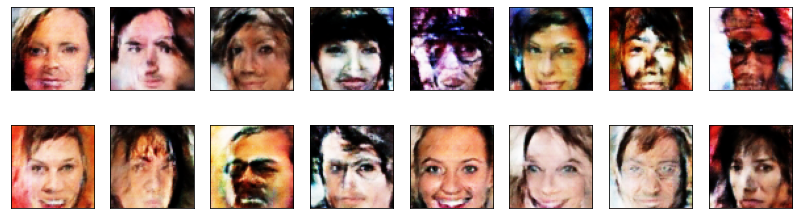

2024-10-29 22:08:40 | Epoch [25/50] | Batch 0/509 | d_loss: 0.4195 | g_loss: 3.1079
2024-10-29 22:09:11 | Epoch [25/50] | Batch 50/509 | d_loss: 0.5098 | g_loss: 2.6552
2024-10-29 22:09:42 | Epoch [25/50] | Batch 100/509 | d_loss: 0.9182 | g_loss: 1.0122
2024-10-29 22:10:13 | Epoch [25/50] | Batch 150/509 | d_loss: 1.2908 | g_loss: 0.7571
2024-10-29 22:10:44 | Epoch [25/50] | Batch 200/509 | d_loss: 0.4108 | g_loss: 4.9221
2024-10-29 22:11:15 | Epoch [25/50] | Batch 250/509 | d_loss: 0.4379 | g_loss: 5.0153
2024-10-29 22:11:46 | Epoch [25/50] | Batch 300/509 | d_loss: 0.3554 | g_loss: 4.5096
2024-10-29 22:12:17 | Epoch [25/50] | Batch 350/509 | d_loss: 0.6075 | g_loss: 2.6144
2024-10-29 22:12:48 | Epoch [25/50] | Batch 400/509 | d_loss: 0.3744 | g_loss: 4.9752
2024-10-29 22:13:19 | Epoch [25/50] | Batch 450/509 | d_loss: 0.3487 | g_loss: 5.2526
2024-10-29 22:13:50 | Epoch [25/50] | Batch 500/509 | d_loss: 0.3686 | g_loss: 3.8589


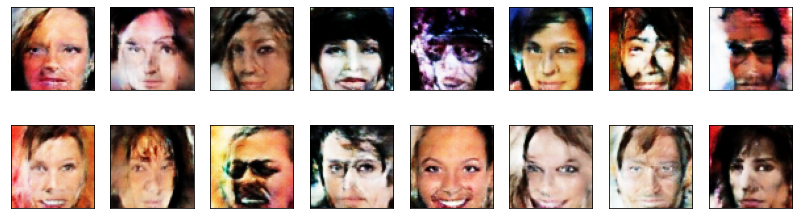

2024-10-29 22:13:59 | Epoch [26/50] | Batch 0/509 | d_loss: 0.3645 | g_loss: 5.1505
2024-10-29 22:14:31 | Epoch [26/50] | Batch 50/509 | d_loss: 0.3646 | g_loss: 4.6401
2024-10-29 22:15:01 | Epoch [26/50] | Batch 100/509 | d_loss: 0.3533 | g_loss: 5.0301
2024-10-29 22:15:32 | Epoch [26/50] | Batch 150/509 | d_loss: 0.3744 | g_loss: 4.8680
2024-10-29 22:16:03 | Epoch [26/50] | Batch 200/509 | d_loss: 0.3513 | g_loss: 5.6726
2024-10-29 22:16:34 | Epoch [26/50] | Batch 250/509 | d_loss: 0.3427 | g_loss: 4.9828
2024-10-29 22:17:05 | Epoch [26/50] | Batch 300/509 | d_loss: 0.4177 | g_loss: 3.7467
2024-10-29 22:17:36 | Epoch [26/50] | Batch 350/509 | d_loss: 0.4065 | g_loss: 3.1144
2024-10-29 22:18:07 | Epoch [26/50] | Batch 400/509 | d_loss: 0.3379 | g_loss: 4.7315
2024-10-29 22:18:38 | Epoch [26/50] | Batch 450/509 | d_loss: 0.3476 | g_loss: 6.7432
2024-10-29 22:19:09 | Epoch [26/50] | Batch 500/509 | d_loss: 0.3503 | g_loss: 6.4738


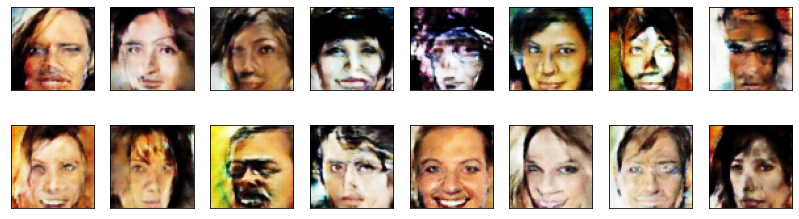

2024-10-29 22:19:19 | Epoch [27/50] | Batch 0/509 | d_loss: 0.3527 | g_loss: 7.4569
2024-10-29 22:19:50 | Epoch [27/50] | Batch 50/509 | d_loss: 0.3454 | g_loss: 6.0654
2024-10-29 22:20:21 | Epoch [27/50] | Batch 100/509 | d_loss: 0.6562 | g_loss: 1.3654
2024-10-29 22:20:52 | Epoch [27/50] | Batch 150/509 | d_loss: 0.3370 | g_loss: 7.1204
2024-10-29 22:21:23 | Epoch [27/50] | Batch 200/509 | d_loss: 0.3360 | g_loss: 7.0585
2024-10-29 22:21:54 | Epoch [27/50] | Batch 250/509 | d_loss: 0.3363 | g_loss: 6.1993
2024-10-29 22:22:25 | Epoch [27/50] | Batch 300/509 | d_loss: 0.3382 | g_loss: 5.4491
2024-10-29 22:22:56 | Epoch [27/50] | Batch 350/509 | d_loss: 0.4265 | g_loss: 3.7356
2024-10-29 22:23:27 | Epoch [27/50] | Batch 400/509 | d_loss: 0.3625 | g_loss: 4.3038
2024-10-29 22:23:58 | Epoch [27/50] | Batch 450/509 | d_loss: 0.3489 | g_loss: 5.5754
2024-10-29 22:24:29 | Epoch [27/50] | Batch 500/509 | d_loss: 0.3767 | g_loss: 5.3137


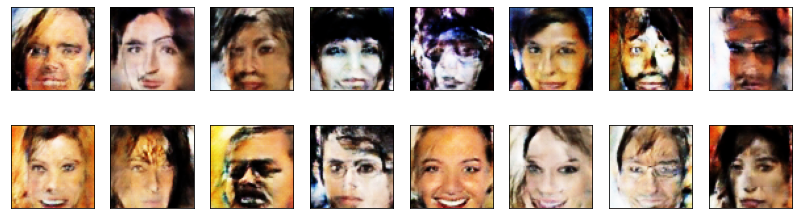

2024-10-29 22:24:39 | Epoch [28/50] | Batch 0/509 | d_loss: 0.3425 | g_loss: 6.2986
2024-10-29 22:25:10 | Epoch [28/50] | Batch 50/509 | d_loss: 0.4574 | g_loss: 6.7810
2024-10-29 22:25:41 | Epoch [28/50] | Batch 100/509 | d_loss: 0.3809 | g_loss: 3.7544
2024-10-29 22:26:12 | Epoch [28/50] | Batch 150/509 | d_loss: 0.5502 | g_loss: 4.2452
2024-10-29 22:26:43 | Epoch [28/50] | Batch 200/509 | d_loss: 0.3587 | g_loss: 5.2430
2024-10-29 22:27:14 | Epoch [28/50] | Batch 250/509 | d_loss: 0.8214 | g_loss: 1.4851
2024-10-29 22:27:45 | Epoch [28/50] | Batch 300/509 | d_loss: 0.3719 | g_loss: 4.4749
2024-10-29 22:28:16 | Epoch [28/50] | Batch 350/509 | d_loss: 0.7340 | g_loss: 3.4318
2024-10-29 22:28:47 | Epoch [28/50] | Batch 400/509 | d_loss: 0.3647 | g_loss: 4.5261
2024-10-29 22:29:17 | Epoch [28/50] | Batch 450/509 | d_loss: 0.4338 | g_loss: 3.1471
2024-10-29 22:29:49 | Epoch [28/50] | Batch 500/509 | d_loss: 0.3491 | g_loss: 5.6454


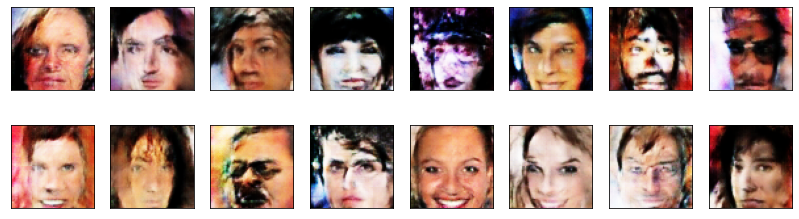

2024-10-29 22:29:58 | Epoch [29/50] | Batch 0/509 | d_loss: 0.3604 | g_loss: 4.8062
2024-10-29 22:30:29 | Epoch [29/50] | Batch 50/509 | d_loss: 0.3907 | g_loss: 5.8985
2024-10-29 22:31:00 | Epoch [29/50] | Batch 100/509 | d_loss: 0.3408 | g_loss: 4.9083
2024-10-29 22:31:31 | Epoch [29/50] | Batch 150/509 | d_loss: 0.3701 | g_loss: 4.1484
2024-10-29 22:32:02 | Epoch [29/50] | Batch 200/509 | d_loss: 0.3459 | g_loss: 4.9199
2024-10-29 22:32:33 | Epoch [29/50] | Batch 250/509 | d_loss: 0.3471 | g_loss: 6.2275
2024-10-29 22:33:04 | Epoch [29/50] | Batch 300/509 | d_loss: 0.3320 | g_loss: 6.6016
2024-10-29 22:33:35 | Epoch [29/50] | Batch 350/509 | d_loss: 0.3476 | g_loss: 5.7216
2024-10-29 22:34:06 | Epoch [29/50] | Batch 400/509 | d_loss: 0.3487 | g_loss: 5.6860
2024-10-29 22:34:37 | Epoch [29/50] | Batch 450/509 | d_loss: 0.4023 | g_loss: 6.9558
2024-10-29 22:35:08 | Epoch [29/50] | Batch 500/509 | d_loss: 0.3827 | g_loss: 8.3909


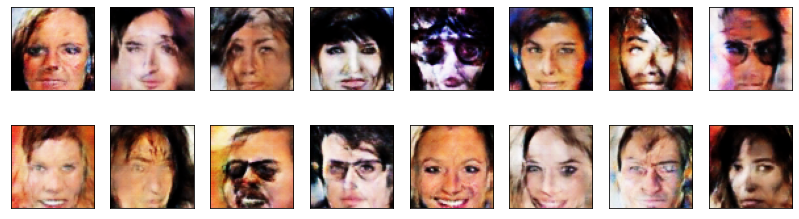

2024-10-29 22:35:17 | Epoch [30/50] | Batch 0/509 | d_loss: 0.3877 | g_loss: 4.7116
2024-10-29 22:35:48 | Epoch [30/50] | Batch 50/509 | d_loss: 0.3346 | g_loss: 4.5436
2024-10-29 22:36:19 | Epoch [30/50] | Batch 100/509 | d_loss: 0.3582 | g_loss: 6.0794
2024-10-29 22:36:50 | Epoch [30/50] | Batch 150/509 | d_loss: 0.3360 | g_loss: 6.2173
2024-10-29 22:37:21 | Epoch [30/50] | Batch 200/509 | d_loss: 0.3577 | g_loss: 4.3908
2024-10-29 22:37:52 | Epoch [30/50] | Batch 250/509 | d_loss: 0.3558 | g_loss: 4.6978
2024-10-29 22:38:23 | Epoch [30/50] | Batch 300/509 | d_loss: 0.3398 | g_loss: 6.5977
2024-10-29 22:38:54 | Epoch [30/50] | Batch 350/509 | d_loss: 0.3345 | g_loss: 4.7267
2024-10-29 22:39:26 | Epoch [30/50] | Batch 400/509 | d_loss: 0.3485 | g_loss: 7.3126
2024-10-29 22:39:57 | Epoch [30/50] | Batch 450/509 | d_loss: 0.3364 | g_loss: 6.1825
2024-10-29 22:40:27 | Epoch [30/50] | Batch 500/509 | d_loss: 0.3647 | g_loss: 8.7002


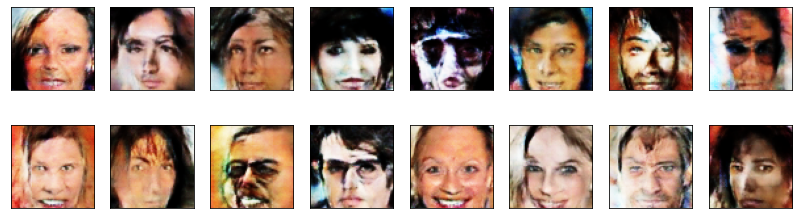

2024-10-29 22:40:38 | Epoch [31/50] | Batch 0/509 | d_loss: 0.3376 | g_loss: 7.7927
2024-10-29 22:41:09 | Epoch [31/50] | Batch 50/509 | d_loss: 0.3377 | g_loss: 7.0787
2024-10-29 22:41:40 | Epoch [31/50] | Batch 100/509 | d_loss: 0.3602 | g_loss: 6.7943
2024-10-29 22:42:11 | Epoch [31/50] | Batch 150/509 | d_loss: 0.4340 | g_loss: 3.7540
2024-10-29 22:42:42 | Epoch [31/50] | Batch 200/509 | d_loss: 0.3339 | g_loss: 5.9654
2024-10-29 22:43:13 | Epoch [31/50] | Batch 250/509 | d_loss: 0.4163 | g_loss: 4.2032
2024-10-29 22:43:44 | Epoch [31/50] | Batch 300/509 | d_loss: 0.3970 | g_loss: 4.3231
2024-10-29 22:44:15 | Epoch [31/50] | Batch 350/509 | d_loss: 0.4336 | g_loss: 3.8002
2024-10-29 22:44:46 | Epoch [31/50] | Batch 400/509 | d_loss: 0.3982 | g_loss: 4.4139
2024-10-29 22:45:17 | Epoch [31/50] | Batch 450/509 | d_loss: 0.3843 | g_loss: 4.0299
2024-10-29 22:45:48 | Epoch [31/50] | Batch 500/509 | d_loss: 0.3607 | g_loss: 4.5816


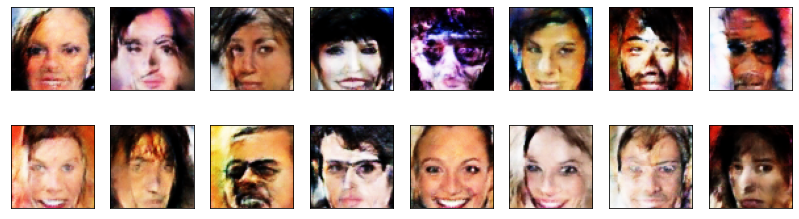

2024-10-29 22:45:57 | Epoch [32/50] | Batch 0/509 | d_loss: 0.3723 | g_loss: 4.4128
2024-10-29 22:46:28 | Epoch [32/50] | Batch 50/509 | d_loss: 0.3696 | g_loss: 4.1063
2024-10-29 22:46:59 | Epoch [32/50] | Batch 100/509 | d_loss: 0.3644 | g_loss: 4.4759
2024-10-29 22:47:30 | Epoch [32/50] | Batch 150/509 | d_loss: 0.3496 | g_loss: 5.7297
2024-10-29 22:48:01 | Epoch [32/50] | Batch 200/509 | d_loss: 0.5226 | g_loss: 3.3207
2024-10-29 22:48:32 | Epoch [32/50] | Batch 250/509 | d_loss: 0.4029 | g_loss: 3.7176
2024-10-29 22:49:03 | Epoch [32/50] | Batch 300/509 | d_loss: 0.5110 | g_loss: 5.3796
2024-10-29 22:49:34 | Epoch [32/50] | Batch 350/509 | d_loss: 0.9458 | g_loss: 6.6896
2024-10-29 22:50:05 | Epoch [32/50] | Batch 400/509 | d_loss: 0.6313 | g_loss: 4.1585
2024-10-29 22:50:36 | Epoch [32/50] | Batch 450/509 | d_loss: 0.4115 | g_loss: 4.6306
2024-10-29 22:51:07 | Epoch [32/50] | Batch 500/509 | d_loss: 0.3988 | g_loss: 3.7717


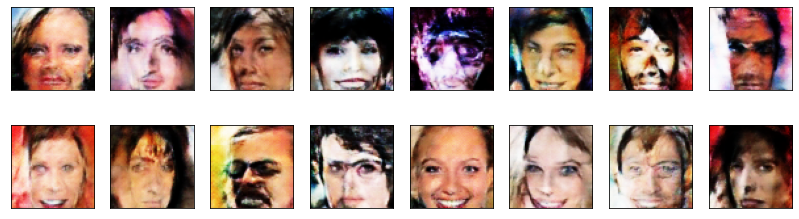

2024-10-29 22:51:16 | Epoch [33/50] | Batch 0/509 | d_loss: 0.4117 | g_loss: 3.8786
2024-10-29 22:51:47 | Epoch [33/50] | Batch 50/509 | d_loss: 0.3771 | g_loss: 4.6509
2024-10-29 22:52:18 | Epoch [33/50] | Batch 100/509 | d_loss: 0.3608 | g_loss: 5.0287
2024-10-29 22:52:49 | Epoch [33/50] | Batch 150/509 | d_loss: 0.3609 | g_loss: 6.6563
2024-10-29 22:53:20 | Epoch [33/50] | Batch 200/509 | d_loss: 0.3620 | g_loss: 4.9944
2024-10-29 22:53:51 | Epoch [33/50] | Batch 250/509 | d_loss: 0.3559 | g_loss: 4.5244
2024-10-29 22:54:22 | Epoch [33/50] | Batch 300/509 | d_loss: 0.3525 | g_loss: 5.9219
2024-10-29 22:54:53 | Epoch [33/50] | Batch 350/509 | d_loss: 0.3420 | g_loss: 6.4714
2024-10-29 22:55:24 | Epoch [33/50] | Batch 400/509 | d_loss: 0.3337 | g_loss: 6.3195
2024-10-29 22:55:55 | Epoch [33/50] | Batch 450/509 | d_loss: 0.3722 | g_loss: 4.6743
2024-10-29 22:56:26 | Epoch [33/50] | Batch 500/509 | d_loss: 0.3458 | g_loss: 5.2543


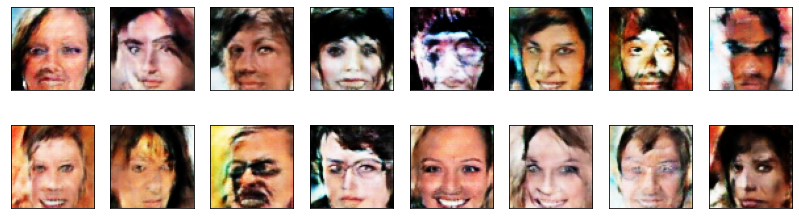

2024-10-29 22:56:35 | Epoch [34/50] | Batch 0/509 | d_loss: 0.3568 | g_loss: 6.7978
2024-10-29 22:57:06 | Epoch [34/50] | Batch 50/509 | d_loss: 0.3720 | g_loss: 5.3072
2024-10-29 22:57:37 | Epoch [34/50] | Batch 100/509 | d_loss: 0.3482 | g_loss: 5.5504
2024-10-29 22:58:08 | Epoch [34/50] | Batch 150/509 | d_loss: 0.3384 | g_loss: 5.8577
2024-10-29 22:58:39 | Epoch [34/50] | Batch 200/509 | d_loss: 0.3659 | g_loss: 6.4701
2024-10-29 22:59:10 | Epoch [34/50] | Batch 250/509 | d_loss: 0.3462 | g_loss: 5.4097
2024-10-29 22:59:41 | Epoch [34/50] | Batch 300/509 | d_loss: 0.3427 | g_loss: 5.4532
2024-10-29 23:00:12 | Epoch [34/50] | Batch 350/509 | d_loss: 0.4419 | g_loss: 5.2743
2024-10-29 23:00:43 | Epoch [34/50] | Batch 400/509 | d_loss: 0.3902 | g_loss: 3.6378
2024-10-29 23:01:14 | Epoch [34/50] | Batch 450/509 | d_loss: 0.3991 | g_loss: 7.1590
2024-10-29 23:01:45 | Epoch [34/50] | Batch 500/509 | d_loss: 0.3466 | g_loss: 5.9011


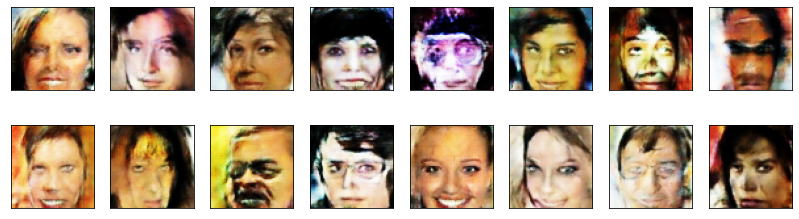

2024-10-29 23:01:54 | Epoch [35/50] | Batch 0/509 | d_loss: 0.3378 | g_loss: 5.2502
2024-10-29 23:02:25 | Epoch [35/50] | Batch 50/509 | d_loss: 0.3704 | g_loss: 3.4838
2024-10-29 23:02:56 | Epoch [35/50] | Batch 100/509 | d_loss: 0.4093 | g_loss: 3.3523
2024-10-29 23:03:27 | Epoch [35/50] | Batch 150/509 | d_loss: 0.3766 | g_loss: 5.3196
2024-10-29 23:03:58 | Epoch [35/50] | Batch 200/509 | d_loss: 0.3378 | g_loss: 5.2652
2024-10-29 23:04:29 | Epoch [35/50] | Batch 250/509 | d_loss: 0.3355 | g_loss: 6.5819
2024-10-29 23:04:59 | Epoch [35/50] | Batch 300/509 | d_loss: 0.3351 | g_loss: 5.8721
2024-10-29 23:05:30 | Epoch [35/50] | Batch 350/509 | d_loss: 0.3398 | g_loss: 5.4598
2024-10-29 23:06:01 | Epoch [35/50] | Batch 400/509 | d_loss: 0.3878 | g_loss: 7.5766
2024-10-29 23:06:32 | Epoch [35/50] | Batch 450/509 | d_loss: 0.3412 | g_loss: 6.2078
2024-10-29 23:07:03 | Epoch [35/50] | Batch 500/509 | d_loss: 0.3523 | g_loss: 7.9511


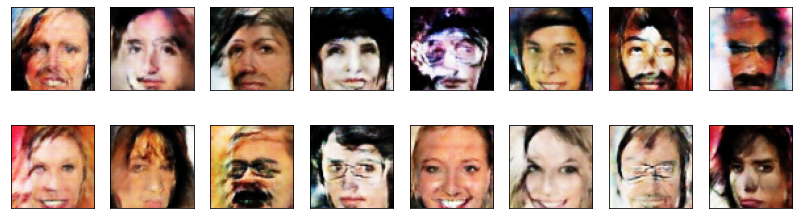

2024-10-29 23:07:12 | Epoch [36/50] | Batch 0/509 | d_loss: 0.3517 | g_loss: 7.3534
2024-10-29 23:07:43 | Epoch [36/50] | Batch 50/509 | d_loss: 0.3416 | g_loss: 5.5485
2024-10-29 23:08:14 | Epoch [36/50] | Batch 100/509 | d_loss: 0.3373 | g_loss: 5.7495
2024-10-29 23:08:45 | Epoch [36/50] | Batch 150/509 | d_loss: 0.3350 | g_loss: 5.7726
2024-10-29 23:09:16 | Epoch [36/50] | Batch 200/509 | d_loss: 0.4089 | g_loss: 4.6063
2024-10-29 23:09:47 | Epoch [36/50] | Batch 250/509 | d_loss: 0.3692 | g_loss: 4.6270
2024-10-29 23:10:18 | Epoch [36/50] | Batch 300/509 | d_loss: 0.7131 | g_loss: 2.3494
2024-10-29 23:10:49 | Epoch [36/50] | Batch 350/509 | d_loss: 0.5532 | g_loss: 6.5614
2024-10-29 23:11:20 | Epoch [36/50] | Batch 400/509 | d_loss: 0.3712 | g_loss: 5.7407
2024-10-29 23:11:51 | Epoch [36/50] | Batch 450/509 | d_loss: 0.3662 | g_loss: 7.3270
2024-10-29 23:12:22 | Epoch [36/50] | Batch 500/509 | d_loss: 0.3342 | g_loss: 7.1474


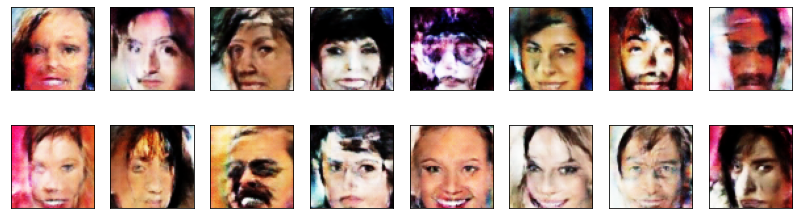

2024-10-29 23:12:32 | Epoch [37/50] | Batch 0/509 | d_loss: 0.4784 | g_loss: 6.6613
2024-10-29 23:13:03 | Epoch [37/50] | Batch 50/509 | d_loss: 0.3608 | g_loss: 7.6542
2024-10-29 23:13:34 | Epoch [37/50] | Batch 100/509 | d_loss: 0.3453 | g_loss: 5.3749
2024-10-29 23:14:05 | Epoch [37/50] | Batch 150/509 | d_loss: 0.3366 | g_loss: 4.8039
2024-10-29 23:14:36 | Epoch [37/50] | Batch 200/509 | d_loss: 0.3521 | g_loss: 5.2147
2024-10-29 23:15:07 | Epoch [37/50] | Batch 250/509 | d_loss: 0.3443 | g_loss: 4.3987
2024-10-29 23:15:38 | Epoch [37/50] | Batch 300/509 | d_loss: 0.3396 | g_loss: 5.2442
2024-10-29 23:16:09 | Epoch [37/50] | Batch 350/509 | d_loss: 0.3375 | g_loss: 6.5412
2024-10-29 23:16:40 | Epoch [37/50] | Batch 400/509 | d_loss: 0.3420 | g_loss: 5.3016
2024-10-29 23:17:11 | Epoch [37/50] | Batch 450/509 | d_loss: 0.3528 | g_loss: 7.9107
2024-10-29 23:17:42 | Epoch [37/50] | Batch 500/509 | d_loss: 0.3364 | g_loss: 6.3877


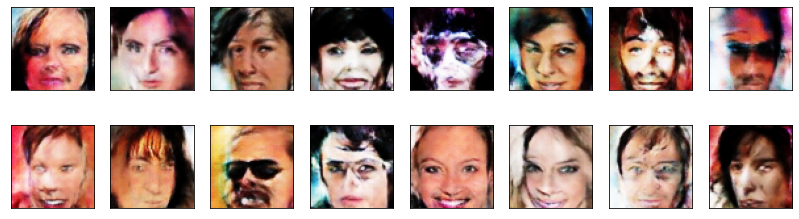

2024-10-29 23:17:52 | Epoch [38/50] | Batch 0/509 | d_loss: 0.4346 | g_loss: 3.1303
2024-10-29 23:18:23 | Epoch [38/50] | Batch 50/509 | d_loss: 0.3665 | g_loss: 4.7106
2024-10-29 23:18:54 | Epoch [38/50] | Batch 100/509 | d_loss: 0.3474 | g_loss: 5.7842
2024-10-29 23:19:25 | Epoch [38/50] | Batch 150/509 | d_loss: 0.3578 | g_loss: 7.0919
2024-10-29 23:19:56 | Epoch [38/50] | Batch 200/509 | d_loss: 0.3477 | g_loss: 6.9755
2024-10-29 23:20:27 | Epoch [38/50] | Batch 250/509 | d_loss: 0.3395 | g_loss: 8.4210
2024-10-29 23:20:58 | Epoch [38/50] | Batch 300/509 | d_loss: 0.3497 | g_loss: 7.1819
2024-10-29 23:21:29 | Epoch [38/50] | Batch 350/509 | d_loss: 0.3967 | g_loss: 4.5055
2024-10-29 23:22:00 | Epoch [38/50] | Batch 400/509 | d_loss: 0.4323 | g_loss: 4.6020
2024-10-29 23:22:31 | Epoch [38/50] | Batch 450/509 | d_loss: 0.3634 | g_loss: 4.0696
2024-10-29 23:23:02 | Epoch [38/50] | Batch 500/509 | d_loss: 0.3691 | g_loss: 3.7619


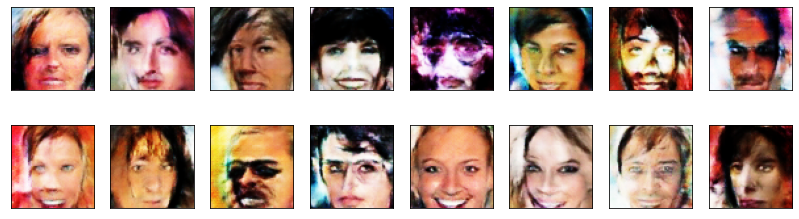

2024-10-29 23:23:10 | Epoch [39/50] | Batch 0/509 | d_loss: 0.4266 | g_loss: 3.3769
2024-10-29 23:23:41 | Epoch [39/50] | Batch 50/509 | d_loss: 0.3580 | g_loss: 6.2362
2024-10-29 23:24:12 | Epoch [39/50] | Batch 100/509 | d_loss: 0.3642 | g_loss: 4.8014
2024-10-29 23:24:43 | Epoch [39/50] | Batch 150/509 | d_loss: 0.3661 | g_loss: 5.8312
2024-10-29 23:25:14 | Epoch [39/50] | Batch 200/509 | d_loss: 0.3511 | g_loss: 4.5694
2024-10-29 23:25:45 | Epoch [39/50] | Batch 250/509 | d_loss: 0.3713 | g_loss: 6.4481
2024-10-29 23:26:16 | Epoch [39/50] | Batch 300/509 | d_loss: 0.4377 | g_loss: 3.8519
2024-10-29 23:26:47 | Epoch [39/50] | Batch 350/509 | d_loss: 0.4596 | g_loss: 4.3190
2024-10-29 23:27:18 | Epoch [39/50] | Batch 400/509 | d_loss: 0.3741 | g_loss: 4.8746
2024-10-29 23:27:49 | Epoch [39/50] | Batch 450/509 | d_loss: 0.3884 | g_loss: 3.9289
2024-10-29 23:28:20 | Epoch [39/50] | Batch 500/509 | d_loss: 0.3469 | g_loss: 4.9666


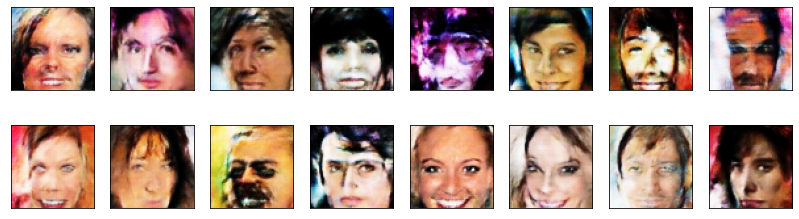

2024-10-29 23:28:30 | Epoch [40/50] | Batch 0/509 | d_loss: 0.3740 | g_loss: 5.2675
2024-10-29 23:29:01 | Epoch [40/50] | Batch 50/509 | d_loss: 0.3439 | g_loss: 5.6905
2024-10-29 23:29:32 | Epoch [40/50] | Batch 100/509 | d_loss: 0.3851 | g_loss: 6.8276
2024-10-29 23:30:03 | Epoch [40/50] | Batch 150/509 | d_loss: 0.4247 | g_loss: 3.7559
2024-10-29 23:30:34 | Epoch [40/50] | Batch 200/509 | d_loss: 0.4371 | g_loss: 5.2887
2024-10-29 23:31:05 | Epoch [40/50] | Batch 250/509 | d_loss: 0.3653 | g_loss: 4.9620
2024-10-29 23:31:36 | Epoch [40/50] | Batch 300/509 | d_loss: 0.3713 | g_loss: 4.8166
2024-10-29 23:32:07 | Epoch [40/50] | Batch 350/509 | d_loss: 0.4184 | g_loss: 4.1144
2024-10-29 23:32:38 | Epoch [40/50] | Batch 400/509 | d_loss: 0.3504 | g_loss: 4.8630
2024-10-29 23:33:09 | Epoch [40/50] | Batch 450/509 | d_loss: 0.3409 | g_loss: 6.1783
2024-10-29 23:33:39 | Epoch [40/50] | Batch 500/509 | d_loss: 0.3775 | g_loss: 5.0325


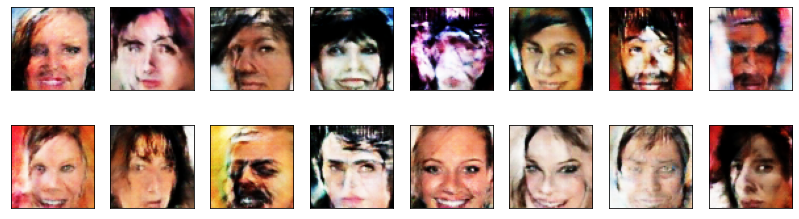

2024-10-29 23:33:49 | Epoch [41/50] | Batch 0/509 | d_loss: 0.3550 | g_loss: 5.9315
2024-10-29 23:34:20 | Epoch [41/50] | Batch 50/509 | d_loss: 0.3402 | g_loss: 7.3499
2024-10-29 23:34:51 | Epoch [41/50] | Batch 100/509 | d_loss: 0.3870 | g_loss: 6.2939
2024-10-29 23:35:21 | Epoch [41/50] | Batch 150/509 | d_loss: 0.3347 | g_loss: 6.0997
2024-10-29 23:35:52 | Epoch [41/50] | Batch 200/509 | d_loss: 0.3319 | g_loss: 5.3181
2024-10-29 23:36:23 | Epoch [41/50] | Batch 250/509 | d_loss: 0.3469 | g_loss: 5.1242
2024-10-29 23:36:54 | Epoch [41/50] | Batch 300/509 | d_loss: 0.3425 | g_loss: 6.8561
2024-10-29 23:37:27 | Epoch [41/50] | Batch 350/509 | d_loss: 0.3367 | g_loss: 7.3726
2024-10-29 23:37:58 | Epoch [41/50] | Batch 400/509 | d_loss: 0.3498 | g_loss: 7.0055
2024-10-29 23:38:29 | Epoch [41/50] | Batch 450/509 | d_loss: 0.3334 | g_loss: 6.8671
2024-10-29 23:39:00 | Epoch [41/50] | Batch 500/509 | d_loss: 0.3562 | g_loss: 4.8534


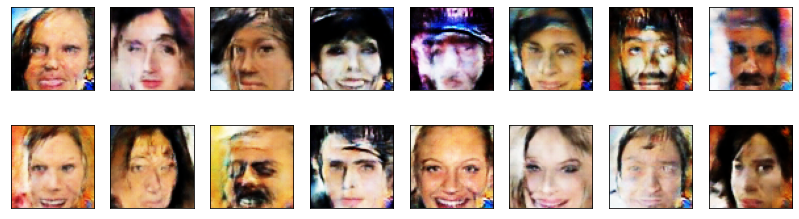

2024-10-29 23:39:10 | Epoch [42/50] | Batch 0/509 | d_loss: 0.3482 | g_loss: 4.5056
2024-10-29 23:39:41 | Epoch [42/50] | Batch 50/509 | d_loss: 0.3446 | g_loss: 7.4900
2024-10-29 23:40:12 | Epoch [42/50] | Batch 100/509 | d_loss: 0.3358 | g_loss: 6.3560
2024-10-29 23:40:43 | Epoch [42/50] | Batch 150/509 | d_loss: 0.3528 | g_loss: 6.0688
2024-10-29 23:41:13 | Epoch [42/50] | Batch 200/509 | d_loss: 0.3420 | g_loss: 5.5324
2024-10-29 23:41:44 | Epoch [42/50] | Batch 250/509 | d_loss: 0.5414 | g_loss: 7.2027
2024-10-29 23:42:15 | Epoch [42/50] | Batch 300/509 | d_loss: 0.3427 | g_loss: 7.0590
2024-10-29 23:42:47 | Epoch [42/50] | Batch 350/509 | d_loss: 0.3635 | g_loss: 4.0105
2024-10-29 23:43:18 | Epoch [42/50] | Batch 400/509 | d_loss: 0.3737 | g_loss: 8.1249
2024-10-29 23:43:49 | Epoch [42/50] | Batch 450/509 | d_loss: 0.3419 | g_loss: 7.7584
2024-10-29 23:44:20 | Epoch [42/50] | Batch 500/509 | d_loss: 0.3749 | g_loss: 5.7432


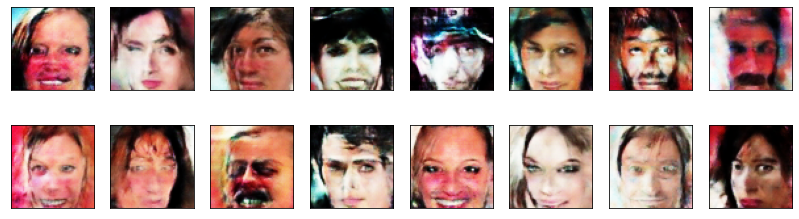

2024-10-29 23:44:30 | Epoch [43/50] | Batch 0/509 | d_loss: 0.3782 | g_loss: 6.4398
2024-10-29 23:45:01 | Epoch [43/50] | Batch 50/509 | d_loss: 0.3574 | g_loss: 4.5270
2024-10-29 23:45:32 | Epoch [43/50] | Batch 100/509 | d_loss: 0.3531 | g_loss: 4.4828
2024-10-29 23:46:03 | Epoch [43/50] | Batch 150/509 | d_loss: 0.3376 | g_loss: 5.6976
2024-10-29 23:46:34 | Epoch [43/50] | Batch 200/509 | d_loss: 0.3481 | g_loss: 6.3925
2024-10-29 23:47:04 | Epoch [43/50] | Batch 250/509 | d_loss: 0.3954 | g_loss: 5.1841
2024-10-29 23:47:35 | Epoch [43/50] | Batch 300/509 | d_loss: 0.3429 | g_loss: 7.2813
2024-10-29 23:48:06 | Epoch [43/50] | Batch 350/509 | d_loss: 0.3455 | g_loss: 6.3237
2024-10-29 23:48:37 | Epoch [43/50] | Batch 400/509 | d_loss: 0.3515 | g_loss: 5.5569
2024-10-29 23:49:08 | Epoch [43/50] | Batch 450/509 | d_loss: 0.3419 | g_loss: 7.2491
2024-10-29 23:49:38 | Epoch [43/50] | Batch 500/509 | d_loss: 0.3354 | g_loss: 5.1987


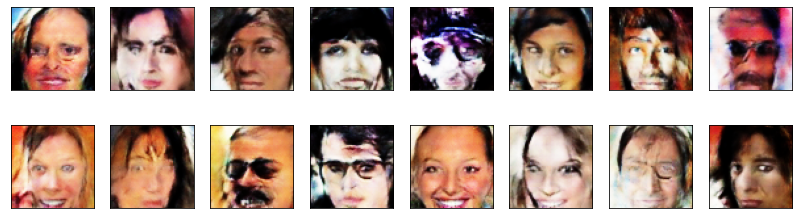

2024-10-29 23:49:48 | Epoch [44/50] | Batch 0/509 | d_loss: 0.3318 | g_loss: 6.7006
2024-10-29 23:50:19 | Epoch [44/50] | Batch 50/509 | d_loss: 0.3325 | g_loss: 6.7541
2024-10-29 23:50:50 | Epoch [44/50] | Batch 100/509 | d_loss: 0.4654 | g_loss: 4.5329
2024-10-29 23:51:20 | Epoch [44/50] | Batch 150/509 | d_loss: 0.3349 | g_loss: 5.4505
2024-10-29 23:51:51 | Epoch [44/50] | Batch 200/509 | d_loss: 0.3300 | g_loss: 7.3215
2024-10-29 23:52:22 | Epoch [44/50] | Batch 250/509 | d_loss: 0.4113 | g_loss: 4.5051
2024-10-29 23:52:53 | Epoch [44/50] | Batch 300/509 | d_loss: 0.3786 | g_loss: 4.2296
2024-10-29 23:53:24 | Epoch [44/50] | Batch 350/509 | d_loss: 0.3497 | g_loss: 5.3019
2024-10-29 23:53:55 | Epoch [44/50] | Batch 400/509 | d_loss: 0.3648 | g_loss: 4.5461
2024-10-29 23:54:26 | Epoch [44/50] | Batch 450/509 | d_loss: 0.3671 | g_loss: 4.0882
2024-10-29 23:54:57 | Epoch [44/50] | Batch 500/509 | d_loss: 0.9281 | g_loss: 0.9913


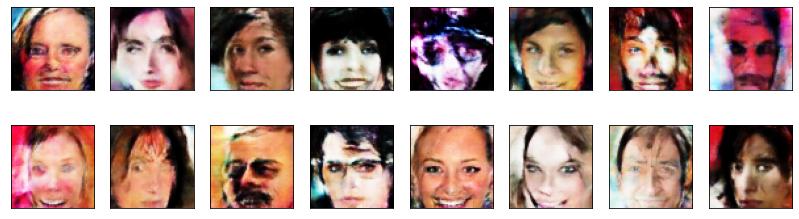

2024-10-29 23:55:07 | Epoch [45/50] | Batch 0/509 | d_loss: 0.4509 | g_loss: 3.6193
2024-10-29 23:55:38 | Epoch [45/50] | Batch 50/509 | d_loss: 0.3469 | g_loss: 5.9053
2024-10-29 23:56:09 | Epoch [45/50] | Batch 100/509 | d_loss: 0.3625 | g_loss: 5.3365
2024-10-29 23:56:40 | Epoch [45/50] | Batch 150/509 | d_loss: 0.3730 | g_loss: 4.0148
2024-10-29 23:57:11 | Epoch [45/50] | Batch 200/509 | d_loss: 0.3388 | g_loss: 6.5050
2024-10-29 23:57:41 | Epoch [45/50] | Batch 250/509 | d_loss: 0.3585 | g_loss: 7.5320
2024-10-29 23:58:12 | Epoch [45/50] | Batch 300/509 | d_loss: 0.3852 | g_loss: 6.7278
2024-10-29 23:58:43 | Epoch [45/50] | Batch 350/509 | d_loss: 0.3644 | g_loss: 4.6924
2024-10-29 23:59:14 | Epoch [45/50] | Batch 400/509 | d_loss: 0.3467 | g_loss: 6.6202
2024-10-29 23:59:45 | Epoch [45/50] | Batch 450/509 | d_loss: 0.3469 | g_loss: 5.9760
2024-10-30 00:00:16 | Epoch [45/50] | Batch 500/509 | d_loss: 0.3630 | g_loss: 5.3720


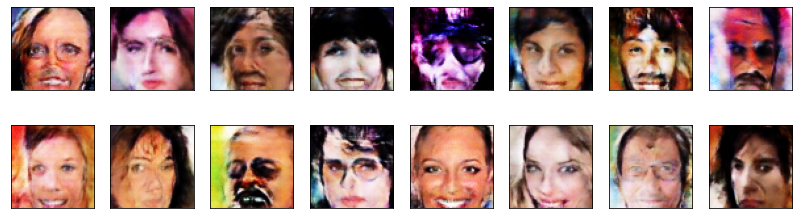

2024-10-30 00:00:27 | Epoch [46/50] | Batch 0/509 | d_loss: 0.3448 | g_loss: 5.1542
2024-10-30 00:00:58 | Epoch [46/50] | Batch 50/509 | d_loss: 0.3380 | g_loss: 5.4894
2024-10-30 00:01:29 | Epoch [46/50] | Batch 100/509 | d_loss: 0.3403 | g_loss: 5.4032
2024-10-30 00:01:59 | Epoch [46/50] | Batch 150/509 | d_loss: 0.3506 | g_loss: 8.1111
2024-10-30 00:02:30 | Epoch [46/50] | Batch 200/509 | d_loss: 0.3415 | g_loss: 7.0847
2024-10-30 00:03:01 | Epoch [46/50] | Batch 250/509 | d_loss: 0.6239 | g_loss: 3.4490
2024-10-30 00:03:32 | Epoch [46/50] | Batch 300/509 | d_loss: 0.4252 | g_loss: 4.0041
2024-10-30 00:04:03 | Epoch [46/50] | Batch 350/509 | d_loss: 0.3760 | g_loss: 4.2040
2024-10-30 00:04:34 | Epoch [46/50] | Batch 400/509 | d_loss: 0.3656 | g_loss: 4.9439
2024-10-30 00:05:05 | Epoch [46/50] | Batch 450/509 | d_loss: 0.4616 | g_loss: 2.3897
2024-10-30 00:05:36 | Epoch [46/50] | Batch 500/509 | d_loss: 0.3677 | g_loss: 4.6475


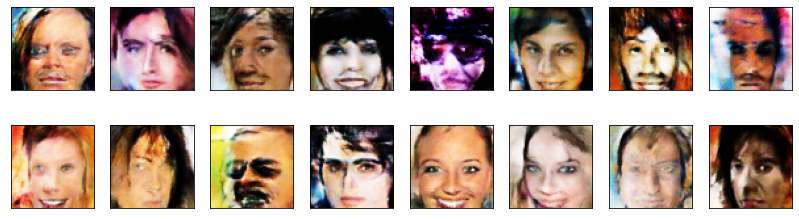

2024-10-30 00:05:46 | Epoch [47/50] | Batch 0/509 | d_loss: 0.3688 | g_loss: 5.5075
2024-10-30 00:06:17 | Epoch [47/50] | Batch 50/509 | d_loss: 0.7833 | g_loss: 2.1672
2024-10-30 00:06:48 | Epoch [47/50] | Batch 100/509 | d_loss: 0.4139 | g_loss: 5.9474
2024-10-30 00:07:19 | Epoch [47/50] | Batch 150/509 | d_loss: 0.6274 | g_loss: 1.7436
2024-10-30 00:07:49 | Epoch [47/50] | Batch 200/509 | d_loss: 0.3396 | g_loss: 5.5218
2024-10-30 00:08:20 | Epoch [47/50] | Batch 250/509 | d_loss: 0.3404 | g_loss: 5.9057
2024-10-30 00:08:51 | Epoch [47/50] | Batch 300/509 | d_loss: 0.3829 | g_loss: 6.2991
2024-10-30 00:09:22 | Epoch [47/50] | Batch 350/509 | d_loss: 0.3487 | g_loss: 5.1217
2024-10-30 00:09:53 | Epoch [47/50] | Batch 400/509 | d_loss: 0.3491 | g_loss: 7.0897
2024-10-30 00:10:24 | Epoch [47/50] | Batch 450/509 | d_loss: 0.3405 | g_loss: 6.4133
2024-10-30 00:10:55 | Epoch [47/50] | Batch 500/509 | d_loss: 1.6801 | g_loss: 0.5762


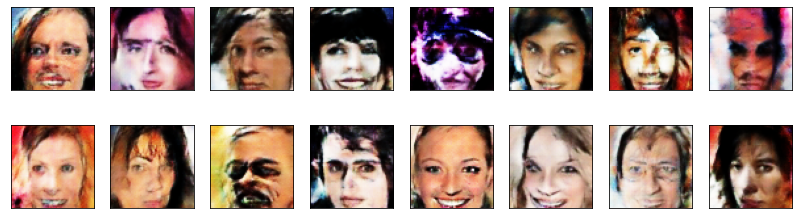

2024-10-30 00:11:04 | Epoch [48/50] | Batch 0/509 | d_loss: 1.6373 | g_loss: 4.1019
2024-10-30 00:11:35 | Epoch [48/50] | Batch 50/509 | d_loss: 0.6232 | g_loss: 1.7491
2024-10-30 00:12:06 | Epoch [48/50] | Batch 100/509 | d_loss: 0.4131 | g_loss: 2.8539
2024-10-30 00:12:37 | Epoch [48/50] | Batch 150/509 | d_loss: 0.3921 | g_loss: 3.0556
2024-10-30 00:13:08 | Epoch [48/50] | Batch 200/509 | d_loss: 0.3628 | g_loss: 4.1279
2024-10-30 00:13:39 | Epoch [48/50] | Batch 250/509 | d_loss: 0.3667 | g_loss: 4.1506
2024-10-30 00:14:10 | Epoch [48/50] | Batch 300/509 | d_loss: 0.3553 | g_loss: 4.2121
2024-10-30 00:14:41 | Epoch [48/50] | Batch 350/509 | d_loss: 0.3938 | g_loss: 5.3209
2024-10-30 00:15:12 | Epoch [48/50] | Batch 400/509 | d_loss: 0.5353 | g_loss: 3.6743
2024-10-30 00:15:43 | Epoch [48/50] | Batch 450/509 | d_loss: 0.4203 | g_loss: 3.6026
2024-10-30 00:16:13 | Epoch [48/50] | Batch 500/509 | d_loss: 0.3607 | g_loss: 5.0165


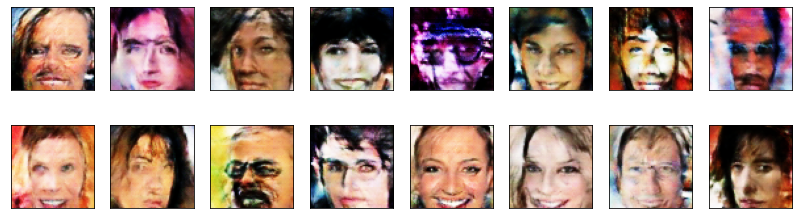

2024-10-30 00:16:22 | Epoch [49/50] | Batch 0/509 | d_loss: 0.3676 | g_loss: 4.0878
2024-10-30 00:16:53 | Epoch [49/50] | Batch 50/509 | d_loss: 0.4021 | g_loss: 3.6322
2024-10-30 00:17:24 | Epoch [49/50] | Batch 100/509 | d_loss: 0.3710 | g_loss: 3.2247
2024-10-30 00:17:55 | Epoch [49/50] | Batch 150/509 | d_loss: 0.3587 | g_loss: 5.0438
2024-10-30 00:18:26 | Epoch [49/50] | Batch 200/509 | d_loss: 0.3548 | g_loss: 5.8811
2024-10-30 00:18:57 | Epoch [49/50] | Batch 250/509 | d_loss: 0.3607 | g_loss: 5.8308
2024-10-30 00:19:28 | Epoch [49/50] | Batch 300/509 | d_loss: 0.3590 | g_loss: 5.0614
2024-10-30 00:19:59 | Epoch [49/50] | Batch 350/509 | d_loss: 0.3466 | g_loss: 5.8904
2024-10-30 00:20:30 | Epoch [49/50] | Batch 400/509 | d_loss: 0.3397 | g_loss: 6.3054
2024-10-30 00:21:01 | Epoch [49/50] | Batch 450/509 | d_loss: 0.3443 | g_loss: 5.9234
2024-10-30 00:21:32 | Epoch [49/50] | Batch 500/509 | d_loss: 0.4183 | g_loss: 4.0556


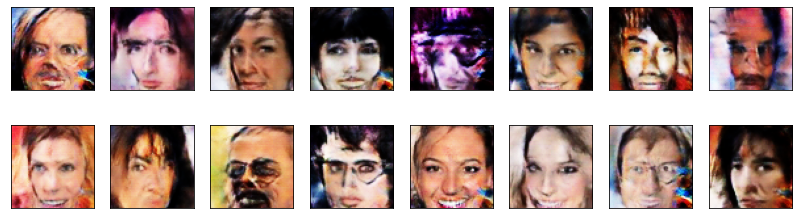

2024-10-30 00:21:41 | Epoch [50/50] | Batch 0/509 | d_loss: 0.3387 | g_loss: 5.3085
2024-10-30 00:22:12 | Epoch [50/50] | Batch 50/509 | d_loss: 0.3816 | g_loss: 6.4777
2024-10-30 00:22:43 | Epoch [50/50] | Batch 100/509 | d_loss: 0.3424 | g_loss: 5.7550
2024-10-30 00:23:14 | Epoch [50/50] | Batch 150/509 | d_loss: 0.3475 | g_loss: 4.6052
2024-10-30 00:23:45 | Epoch [50/50] | Batch 200/509 | d_loss: 0.3446 | g_loss: 5.6976
2024-10-30 00:24:16 | Epoch [50/50] | Batch 250/509 | d_loss: 0.3576 | g_loss: 5.6193
2024-10-30 00:24:47 | Epoch [50/50] | Batch 300/509 | d_loss: 0.3518 | g_loss: 6.3287
2024-10-30 00:25:18 | Epoch [50/50] | Batch 350/509 | d_loss: 0.3778 | g_loss: 4.1905
2024-10-30 00:25:49 | Epoch [50/50] | Batch 400/509 | d_loss: 0.3369 | g_loss: 4.3415
2024-10-30 00:26:20 | Epoch [50/50] | Batch 450/509 | d_loss: 0.4003 | g_loss: 5.8608
2024-10-30 00:26:51 | Epoch [50/50] | Batch 500/509 | d_loss: 0.4019 | g_loss: 4.2393


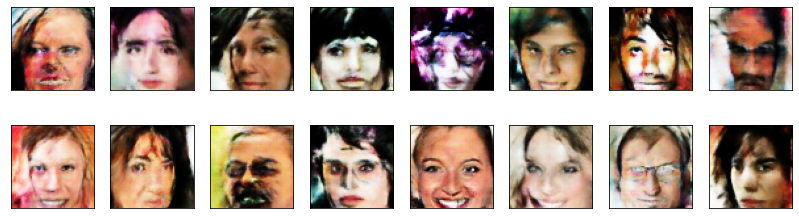

In [91]:
fixed_latent_vector = torch.randn(batch_size, latent_dim, 1, 1).float().cuda()

losses = []
d = 0
g = 0
for epoch in range(n_epochs):
    for batch_i, real_images in enumerate(dataloader):
        real_images = real_images.to(device)
        
        ####################################
        
        # TODO: implement the training strategy
        
        ####################################

        g_loss = generator_step(batch_size, latent_dim, generator, discriminator, g_optimizer)
        d_loss = discriminator_step(batch_size, latent_dim, real_images, 
                                    generator, discriminator, d_optimizer)

        if batch_i % print_every == 0:
            # append discriminator loss and generator loss
            d = d_loss['loss'].item()
            g = g_loss['loss'].item()
            losses.append((d, g))
            # print discriminator and generator loss
            time = str(datetime.now()).split('.')[0]
            print(f'{time} | Epoch [{epoch+1}/{n_epochs}] | Batch {batch_i}/{len(dataloader)} | d_loss: {d:.4f} | g_loss: {g:.4f}')
    
    # display images during training
    generator.eval()
    generated_images = generator(fixed_latent_vector)
    display(generated_images)
    generator.train()

### Training losses

Plot the training losses for the generator and discriminator.

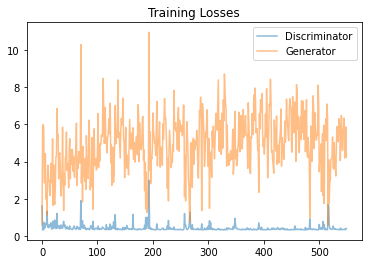

In [92]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

### Question: What do you notice about your generated samples and how might you improve this model?
When you answer this question, consider the following factors:
* The dataset is biased; it is made of "celebrity" faces that are mostly white
* Model size; larger models have the opportunity to learn more features in a data feature space
* Optimization strategy; optimizers and number of epochs affect your final result
* Loss functions

**Answer:** 
1. Low resolution in ==> unable to extract all features.
2. DCGAN with BCEWithLogitsLoss worked to produce images that were decent within 50 epochs of training.
3. Faces with glasses were difficult to replicate ==> need more training data.
4. Blurred eyes were observed ==> lower resolution could be the reason.
5. Blurred areas where hair and skin transitions were seen ==> Feature extraction was not great ==> higher resolution could've helped
6. Gradient penalty could've helped if using BCE loss
7. Hyperparameters: did not optimize past what was already provided

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb".  

Submit the notebook using the ***SUBMIT*** button in the bottom right corner of the Project Workspace.